# Qwen-Image：一句话是怎么变成一张图的

**读者**：没有任何机器学习背景的人。大模型的初学者。

**读法**：每节都是「**做什么 → 跑一下 → 结论**」。结论是加粗的一行，只看结论也能走完全程。

---

## 0. 读之前 30 秒

整条链路长这样：

```
提示词 ──► token ──► 词向量 ┐
                                 ├──► 去噪循环（跑 10 次）──► VAE 解码 ──► 图
随机噪声 ──► latent ──► token 序列 ┘         ▲
                                       σ 时间表决定每次走多远
```

**个人认为三件重要的事**，这份 notebook 为了让读者理解最基本的流程：

1. 文生图是**从一堆纯随机数开始生成的**。与人类一笔一画不一样。
2. 模型**没见过原本像素**，它在一个小 12 倍的压缩空间里干活。
3. 整张图的**构图在第一两步就定死了**，后面的步数只在补细节。

> **环境**：这份 notebook 在 `qwen-dev` 容器里跑，需要一块能放下 54 GB 权重的 GPU。
> 图里的文字是英文 —— 容器的 matplotlib 没有中文字体，写中文会渲染成方块。叙述都在文字段落里。

---
## 1. 最关键的9 个词

全篇基本只用到这 9 个词。现在看不懂没关系，右边一列写了**在第几节能亲眼看到它** ——
这张表同时也是目录。

| 词 | 一句话解释 | 在哪看到 |
|---|---|---|
| **张量** tensor | 一个多维的数字表格。例如形状 (1, 27, 3584)"就是这个表格有多大。这里1 个样本，其中有 27 个元素，每个元素用一个 3584 维向量表示 | §2 起，每节都打印 |
| **latent** | 图像的压缩版。1024×1024 的图压成 128×128 的格子，每个格子是一个 16 维向量 | §5 亲眼看压缩前后 |
| **VAE** | latent 和 图片 的转换器。可以把图片压缩成 latent，也可以把 latent 还原成图片  | §5 |
| **token** | Transformer 一次处理的单位。文字会被切成 token；图像 latent 也会被打包成一个个 token | §6 文本 / §8 图像 |
| **transformer** | Qwen-Image 生成图片的主力模型。它反复读取当前 latent，并预测下一步应该怎样修改 | §3 / §10 |
| **σ** sigma | 表示当前生成过程处在哪个噪声阶段：σ 大时更接近随机噪声，σ 小时更接近最终图片。[0 <= σ <= 1] | §9 |
| **velocity** v | Transformer 预测的“修改方向”：告诉程序当前的 latent 下一步应该往哪个方向改变 | §10 |
| **CFG** | 加强 prompt 对生成结果的影响，让图片更倾向于按照文字要求生成。 | §10 / §11 |
| **seed** | 决定起点那堆随机数的号码。固定 seed + 固定 prompt = 每次出同一张图 | §7 |

**结论**：这 9 个词里有 4 个（latent、token、σ、velocity）是"模型内部的语言"，
它们的存在只有一个理由 —— **让计算量小到跑得动**。后面每一节都会回到这句话。

---
## 准备：安装模型

这段代码只做一件事：把模型从硬盘读进 GPU。**权重 54 GB，冷加载要几分钟，加载一次就够 ——
后面所有格子共用同一个 `pipe`，切记中途不要重启 kernel。**（这也是用 notebook 而不是脚本的理由。）

In [ ]:
# ============================================================
# 1. 显示设置：减少不必要的日志输出
# ============================================================
import os, warnings, logging
os.environ["HF_HUB_DISABLE_PROGRESS_BARS"] = "1"       # 关闭 Hugging Face 下载时的进度条，让 Notebook 输出更干净
warnings.filterwarnings("ignore")   # 忽略一些不影响运行的警告信息


# ============================================================
# 2. Python库
# ============================================================
import math, time
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display


# ============================================================
# 3. 关闭一些第三方库的日志。这些设置不会改变模型，只是让输出更简洁
# ============================================================
logging.getLogger("torch.utils._pytree").setLevel(logging.ERROR)
logging.getLogger("huggingface_hub").setLevel(logging.ERROR)


# ============================================================
# 4. 自己写的可视化工具
# ============================================================
# qwen_viz.py 是本项目自己的辅助文件，后面会用它把 Qwen-Image 内部的数据画出来。
import qwen_viz as qv


# ============================================================
# 5. 导入 Hugging Face 的模型相关库
# ============================================================
import diffusers, transformers

# 减少运行时的日志和进度条，不影响模型计算
diffusers.utils.logging.set_verbosity_error()
diffusers.utils.logging.disable_progress_bar()
transformers.utils.logging.set_verbosity_error()
transformers.utils.logging.disable_progress_bar()


# ============================================================
# 6. 导入 Qwen-Image
# ============================================================
# QwenImagePipeline：Hugging Face 提供的 Qwen-Image 完整生成流程
from diffusers import QwenImagePipeline

# 这两个函数负责设置生成过程中使用的时间步 / sigma
from diffusers.pipelines.qwenimage.pipeline_qwenimage import calculate_shift, retrieve_timesteps


# ============================================================
# 7. 设置 Notebook 中图片和图表的显示风格
# ============================================================
qv.use_notebook_style()


# ============================================================
# 8. 从 Hugging Face 加载 Qwen-Image 模型
# ============================================================

# 记录开始时间，用来计算模型加载花了多久
t0 = time.time()

# 下载并加载 Qwen-Image 的预训练权重
#
# torch_dtype=torch.bfloat16：
# 使用 BF16 保存和计算模型参数，
# 相比 FP32 可以明显减少显存占用
pipe = QwenImagePipeline.from_pretrained("Qwen/Qwen-Image", torch_dtype=torch.bfloat16)


# ============================================================
# 9. 把模型放到 GPU
# ============================================================

# "cuda" 表示 NVIDIA GPU。模型之后的主要计算都会在 GPU 上进行
pipe.to("cuda")
pipe.set_progress_bar_config(disable=True)      # 关闭图片生成过程中的进度条


# ============================================================
# 10. 显示模型加载耗时
# ============================================================
print(f"权重加载用时 {time.time() - t0:.0f}s（约 54 GB）")

权重加载用时 349s（约 54 GB）


### 运行配置

下面所有数字、所有图都由这几个常量决定。改了重跑，每一张图都会跟着变。

In [ ]:
# ------------------------------------------------------------
# 1. Prompt：告诉模型“我们想画什么”
# ------------------------------------------------------------

PROMPT = (
    "A red sports car parked on a quiet city street at sunset, "
    "with realistic lighting and reflections on wet pavement."
)

# Negative Prompt：告诉模型“我们不希望出现什么”
NEGATIVE_PROMPT = "blurry, low quality"


# ------------------------------------------------------------
# 2. 最终图片大小
# ------------------------------------------------------------

# 最终生成一张 1024 × 1024 像素的图片
HEIGHT = WIDTH = 1024


# ------------------------------------------------------------
# 3. 去噪步数
# ------------------------------------------------------------

# 图片一开始是随机噪声。
# Transformer 会反复修改 latent，让它逐渐变成我们想要的图片。
#
# STEPS = 10 表示这个过程进行 10 次。
# 我这里故意使用较少的步数，方便后面把每一步都画出来观察。
STEPS = 10


# ------------------------------------------------------------
# 4. 随机种子
# ------------------------------------------------------------

# 生成过程从随机噪声开始。
# SEED 决定这份随机噪声是什么。
#
# 固定 seed 可以让实验更容易重复和比较。
SEED = 42


# ------------------------------------------------------------
# 5. CFG 强度
# ------------------------------------------------------------

# 控制 prompt 对生成结果的影响强度。
# 数值越大，模型通常会更强调 prompt 中描述的内容。
#
# §10 会具体解释 CFG 是怎么计算的。
TRUE_CFG_SCALE = 4.0


# ------------------------------------------------------------
# 6. 文本最大长度
# ------------------------------------------------------------

# Prompt 会先被 tokenizer 切成 token。
# 最多允许使用 512 个文本 token。
MAX_SEQUENCE_LENGTH = 512


# ------------------------------------------------------------
# 7. 使用哪一个计算设备
# ------------------------------------------------------------

# "cuda" = 使用 NVIDIA GPU
DEVICE = "cuda"


# ------------------------------------------------------------
# 8. 要观察哪些 Transformer 层
# ------------------------------------------------------------

# Qwen-Image Transformer 一共有 60 层。
#
# 我们不需要把每一层都保存下来，
# 所以分别选择：
#   第 10 层：较浅层
#   第 30 层：中间层
#   第 50 层：较深层
#
# §11 会观察这些层内部的 attention。
CAPTURE_LAYERS = [10, 30, 50]


# ------------------------------------------------------------
# 9. 计算图像 token 的排列
# ------------------------------------------------------------

# 对于这里的 Qwen-Image：
# 最终 1024×1024 图片对应 128×128 的 latent 网格，
# 然后每 2×2 个 latent 格子打包成一个 image token。
#
# 所以：
#
# 1024×1024 图片
#       ↓ VAE 空间压缩 8 倍
# 128×128 latent
#       ↓ 每 2×2 格打包
# 64×64 image tokens
#
# 因此最终有：
# 64 × 64 = 4096 个 image tokens

TOKEN_GRID = (HEIGHT // 16, WIDTH // 16)

print(
    "图像 token 网格:",
    TOKEN_GRID,
    "->",
    TOKEN_GRID[0] * TOKEN_GRID[1],
    "个 token"
)

图像 token 网格: (64, 64) -> 4096 个 token


---
## 2. 先看结果

看一眼**要分析的是什么**。下面一行调用就是完整的Qwen-Image文生图 ——
这份 notebook 剩下的 12 节，讲的全是这一行里面究竟发生了什么。

10 步，用时 34.5s


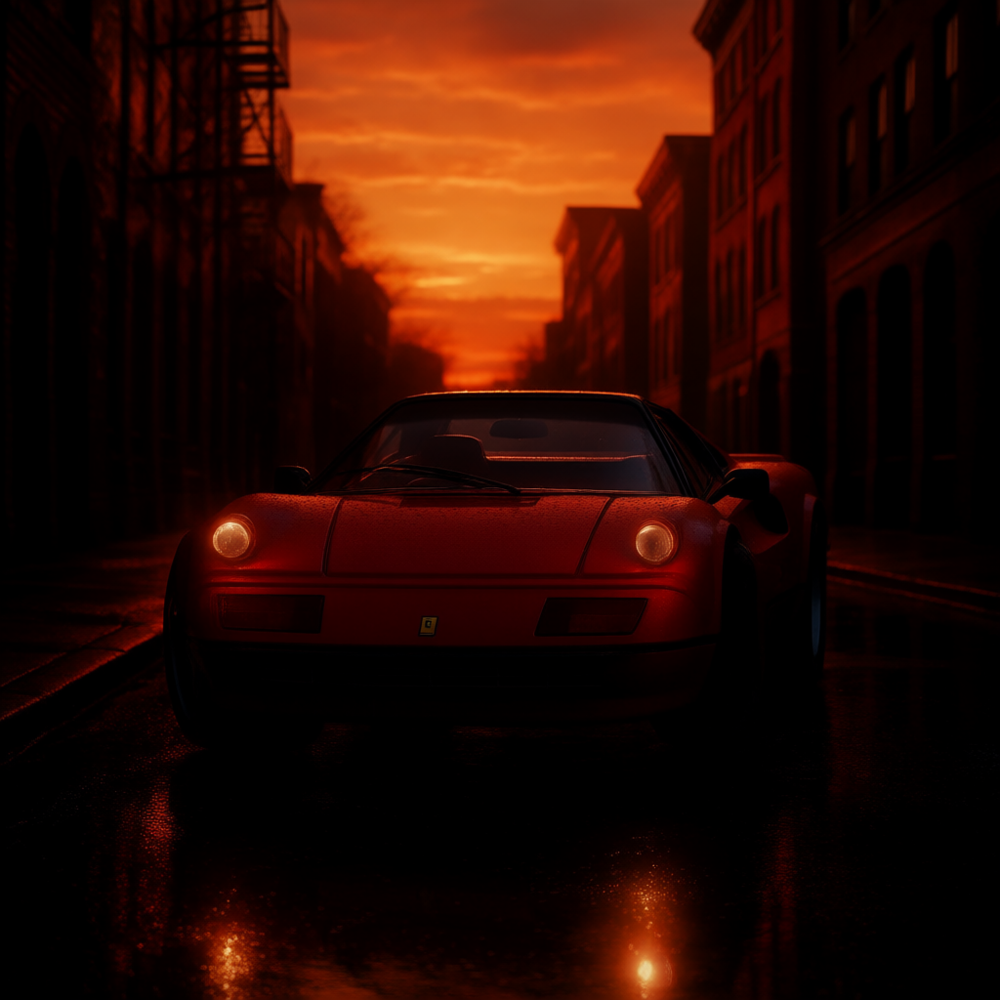

In [ ]:
# ============================================================
# 用 Qwen-Image 正式生成一张图片
# ============================================================

# 记录开始时间，用来计算整张图片生成需要多久
t0 = time.time()


# ------------------------------------------------------------
# 1. 调用 Qwen-Image Pipeline 生成图片
# ------------------------------------------------------------

image_pipe = pipe(

    # 正向提示词：告诉模型“想生成什么”
    prompt=PROMPT,

    # 负向提示词：告诉模型“不想要什么”
    negative_prompt=NEGATIVE_PROMPT,

    # 最终图片尺寸：1024 × 1024
    width=WIDTH,
    height=HEIGHT,

    # 去噪次数。
    # STEPS = 10 表示 Transformer 会进行 10 步生成过程
    num_inference_steps=STEPS,

    # CFG 强度：控制模型多大程度按照 prompt 生成
    true_cfg_scale=TRUE_CFG_SCALE,

    # 创建初始随机噪声。
    # manual_seed(SEED) 固定随机种子，结果可复现
    generator=torch.Generator(device=DEVICE).manual_seed(SEED),).images[0]  # pipe() 返回的结果中可能包含多张图片。.images[0] 取出第一张图片。



# ------------------------------------------------------------
# 2. 打印生成耗时
# ------------------------------------------------------------

print(f"{STEPS} 步，用时 {time.time() - t0:.1f}s")


# ------------------------------------------------------------
# 3. 保存生成结果
# ------------------------------------------------------------

# 把图片保存到 results 文件夹
image_pipe.save(qv.RESULTS / "guide_02_result.png")


# ------------------------------------------------------------
# 4. 在 Jupyter Notebook 中显示图片
# ------------------------------------------------------------

display(image_pipe)

**结论**：一次调用、`STEPS` 步、`SEED` 决定随机起点，出一张 1024×1024 的图。
**这张图后面还要用两次** —— §4 拿它做加噪演示，§5 拿它做 VAE 压缩往返，
所以本项目从头到尾只围绕这一张图。

---
## 3. Qwen-Image 不是一个模型，是三个

三个模型各干一件事，互不重叠。

In [ ]:
# ============================================================
# 看看 Qwen-Image 的三个主要模型分别有多大
# ============================================================

# pipe 里面包含三个我们最关心的模型：
#
# text encoder：读取并理解文字
# transformer ：不断修改 latent，是生成图片的主力
# VAE         ：负责 latent 和图片之间的转换

for name, job, module in [

    ("text encoder", "读懂你的句子",     pipe.text_encoder),

    ("transformer",  "去噪，生成主力",   pipe.transformer),

    ("VAE",          "latent <-> 图片",  pipe.vae),

]:

    # module.parameters() 取出这个模型的所有参数
    # p.numel() 计算每一组参数里有多少个数字
    # 全部加起来，就是这个模型的总参数量
    n = sum(p.numel() for p in module.parameters())

    # 除以 1e9，把参数量换算成 Billion（十亿）
    # 例如 20 B = 约 200 亿个参数
    print(f"{name:<14} {n/1e9:>6.2f} B 参数   {job}")


# ============================================================
# 计算整个 Pipeline 的参数量
# ============================================================

# 把 text encoder、transformer 和 VAE 的参数全部加起来
total = sum(
    sum(p.numel() for p in m.parameters())
    for m in [pipe.text_encoder, pipe.transformer, pipe.vae]
)

# 单独计算 Transformer 的参数量
tr = sum(p.numel() for p in pipe.transformer.parameters())

print()

# 看 Transformer 占整个模型参数量的多少
print(f"合计 {total/1e9:.2f} B，其中 transformer 占 {tr/total:.1%}")

print()


# ============================================================
# 看生成一张图片时，每个模型要运行多少次
# ============================================================

print("一次正常生成里，每个模型各跑几次：")


# Text Encoder 在正式去噪之前运行。
#
# 正面 prompt：
# "A red sports car..."
#
# 负面 prompt：
# "blurry, low quality"
#
# 分别编码成模型能够处理的文字特征。
print(
    "  text encoder   2 次   "
    "（正面提示词 1 次 + 负面提示词 1 次，循环开始前就跑完）"
)


# Transformer 是生成过程中反复运行的主力。
#
# 这里使用 TRUE CFG：
# 每一个去噪 step 都需要分别处理正面和负面条件，
# 所以每一步运行 2 次。
#
# 如果 STEPS = 10：
#
# 10 steps × 2 = 20 次 Transformer
print(
    f"  transformer  {STEPS*2:>3} 次   "
    f"（{STEPS} 步 × 每步 2 次，全在循环里）"
)


# 所有去噪步骤结束以后，
# 得到最终 latent。
#
# 最后使用 VAE Decoder：
#
# latent → 最终的 1024×1024 图片
#
# 因此文生图过程中这里只需要运行一次 VAE Decoder。
print(
    "  VAE            1 次   "
    "（最后把 latent 翻译回图片）"
)

text encoder     8.29 B 参数   读懂你的句子
transformer     20.43 B 参数   去噪，主力
VAE              0.13 B 参数   latent <-> 像素

合计 28.85 B，其中 transformer 占 70.8%

一次正常生成里，每个模型各跑几次：
  text encoder   2 次   （正面提示词 1 次 + 负面提示词 1 次，循环开始前就跑完）
  transformer   20 次   （10 步 x 每步 2 次，全在循环里）
  VAE            1 次   （最后把 latent 翻译回像素）


**结论**：transformer 占了约 7 成参数，而且**循环里每一步都要跑它两次**；文本编码器和 VAE
各只跑一两次。所以时间几乎全花在 transformer 上（§13 有实测：**99.06%**）。

---
## 4. 为什么是"从噪声里擦出来"

这一节**不用模型、不用 GPU**，只用 numpy 和§2那张图。解释为什么生成图像要从随机数开始？

**加噪的路是直的。** Qwen-Image 用的方法叫 flow matching，它规定了一条从图像到噪声的直线：

```
x(σ) = (1 − σ) * 干净图 + σ * 随机噪声
```

σ=0 是干净图，σ=1 是纯噪声，中间就是按比例混合。先把这条路画出来看。

In [ ]:
# ============================================================
# 用一张真实图片，理解 sigma（σ）是什么意思
#
# 这只是为了帮助理解“噪声越来越多”的概念，并不是 Qwen-Image 内部真正的计算过程。
# ============================================================


# ------------------------------------------------------------
# 1. 准备一张干净图片
# ------------------------------------------------------------

# 把刚才生成的 1024×1024 图片缩小到 256×256。这只是为了后面画图更快，不影响我们要演示的概念。
small = image_pipe.resize((256, 256), Image.LANCZOS)

# PIL 图片原本的像素范围是 [0, 255]。
# 这里把它转换成 [-1, 1]，方便后面进行数学计算。
#
# 0   -> -1
# 127 -> 约 0
# 255 -> +1
x0 = np.asarray(small, dtype=np.float32) / 127.5 - 1.0


# ------------------------------------------------------------
# 2. 制造一份完全随机的噪声
# ------------------------------------------------------------

# 创建一个随机数生成器。这里固定 seed=0，让每次运行都得到相同的随机噪声。
rng = np.random.default_rng(0)

# 生成和图片完全相同 shape 的随机数。
#
# x0  shape: (256, 256, 3)
# eps shape: (256, 256, 3)
#
# eps 可以理解成一张“纯噪声图片”。
eps = rng.standard_normal(x0.shape).astype(np.float32)


# ------------------------------------------------------------
# 3. 一个用于显示图片的小函数
# ------------------------------------------------------------

def show(a):

    # 我们计算时使用 [-1, 1] 左右的数值，
    # 但 matplotlib 显示图片通常需要 [0, 1]。所以这里把数值转换回来。
    return np.clip((a + 1) / 2, 0, 1)


# ------------------------------------------------------------
# 4. 人为制造不同程度的噪声
# ------------------------------------------------------------

# 我们想观察 5 种不同的 sigma
ladder_sigmas = [0.2, 0.4, 0.6, 0.8, 1.0]


# 对每个 sigma，都把：干净图片 x0 和 随机噪声 eps 按照不同的比例混合。
#
# 公式： x = (1 - sigma) * 干净图片 + sigma * 随机噪声
#
# sigma = 0：x = 1*x0 + 0*eps → 完全是原图
#
# sigma = 0.5：x = 0.5*x0 + 0.5*eps → 图片和噪声各占一部分
#
# sigma = 1：x = 0*x0 + 1*eps → 完全是随机噪声

noised = [
    show((1 - s) * x0 + s * eps)
    for s in ladder_sigmas
]


# ------------------------------------------------------------
# 5. 打印原图和随机噪声的数值特征
# ------------------------------------------------------------

print(
    "干净图  范围",
    f"[{x0.min():+.2f}, {x0.max():+.2f}]",
    " 标准差",
    f"{x0.std():.3f}"
)

print(
    "纯噪声  范围",
    f"[{eps.min():+.2f}, {eps.max():+.2f}]",
    " 标准差",
    f"{eps.std():.3f}"
)

干净图  范围 [-1.00, +0.96]  标准差 0.352
纯噪声  范围 [-4.59, +4.73]  标准差 1.002


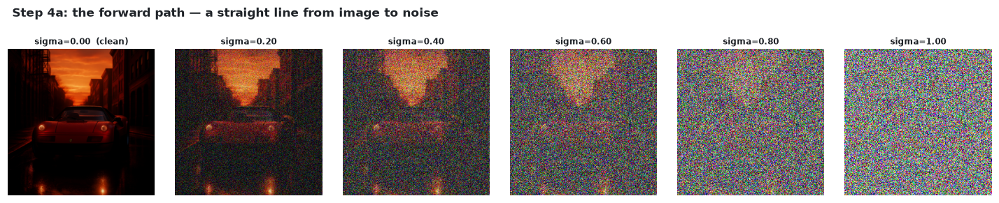

In [ ]:
# 把不同 sigma 下的图片排在一起，观察噪声如何增加
# ============================================================


# ------------------------------------------------------------
# 1. 画出“图片 → 噪声”的变化过程
# ------------------------------------------------------------

# qv.plot_noise_ladder() 是我们自己写的画图函数。
#
# 输入：
#   show(x0)      → 原始的干净图片
#   noised        → 刚才生成的不同噪声程度的图片
#   ladder_sigmas → 每张图片对应的 sigma
#   最后一项       → 图的标题
#
# 最终会把这些图片从左到右排列出来，
# 方便直接观察 sigma 增大时图片如何逐渐变成噪声。

fig = qv.plot_noise_ladder(
    show(x0),
    noised,
    ladder_sigmas,
    "Step 4a: the forward path — a straight line from image to noise"
)


# ------------------------------------------------------------
# 2. 保存这张图
# ------------------------------------------------------------

# 保存到项目的 results 文件夹中
qv.save(fig, "guide_04a_noise_ladder")


# ------------------------------------------------------------
# 3. 在 Jupyter Notebook 中显示
# ------------------------------------------------------------

plt.show()

**反过来走需要什么？** 对这条直线求"方向"。

```
方向 v = 噪声 − 干净图  ←  整条路上处处相同，是一条直线
下一步 x_next = x + (σ_next − σ) * v
```

所以只要知道 v，从纯噪声倒着走回干净图是**纯算术**，一点都不神秘。
下面就用倒推的 v（我们手上有干净图，可以直接算出来）走 10 步试试。

In [ ]:
# ============================================================
# 用一个“作弊实验”理解 velocity（v）
#
# 目标：
# 从纯噪声出发，沿着正确的方向一步步走回原图。
#
# 注意：
# 这里我们已经知道原图 x0，所以可以直接算出正确方向。
# 真正生成图片时，模型并不知道 x0，
# 因此需要 Transformer 来预测这个方向。
# ============================================================


# ------------------------------------------------------------
# 1. 直接计算“正确答案”的 velocity
# ------------------------------------------------------------

# eps = 纯噪声
# x0  = 干净图片
#
# 我们前面定义：
#
# x(sigma) = (1-sigma)x0 + sigma*eps
#
# 对 sigma 求变化方向：
#
# v = eps - x0
#
# 这里因为我们提前知道 x0，所以可以直接算出来。
# 真正的 Qwen-Image 没有这个答案，只能让 Transformer 预测 v。

v_oracle = eps - x0


# ------------------------------------------------------------
# 2. 设置从 sigma=1 到 sigma=0 的 10 个步骤
# ------------------------------------------------------------

# STEPS = 10 时，会得到：
#
# 1.0, 0.9, 0.8, ... , 0.1, 0.0
#
# sigma = 1：纯噪声
# sigma = 0：干净图片

sigmas_toy = np.linspace(1.0, 0.0, STEPS + 1)


# ------------------------------------------------------------
# 3. 从纯噪声开始
# ------------------------------------------------------------

# 一开始 x 就是 eps，也就是纯噪声
x = eps.copy()

# 保存每一步的图片，之后可以画出来观察
walk = []


# ------------------------------------------------------------
# 4. 一步一步从噪声走回图片
# ------------------------------------------------------------

for i in range(STEPS):

    # 保存当前这一步的状态
    walk.append(show(x))

    # 当前 sigma 到下一个 sigma 的变化量
    #
    # 例如：
    # 1.0 -> 0.9
    #
    # Δsigma = 0.9 - 1.0 = -0.1
    #
    # 然后沿着 velocity v 走这么远：
    #
    # x_new = x_old + Δsigma * v

    x = x + (
        sigmas_toy[i + 1] - sigmas_toy[i]
    ) * v_oracle


# ------------------------------------------------------------
# 5. 检查最后有没有真的回到原图
# ------------------------------------------------------------

print("走完 10 步，和原图的差距：")

# 比较最后得到的 x 和真正原图 x0
print(
    f"  最大误差 {np.abs(x - x0).max():.2e}      "
    f"平均误差 {np.abs(x - x0).mean():.2e}"
)

print(
    "  （只剩浮点误差，也就是说：知道 v，就能一步不差地走回去）"
)

走完 10 步，和原图的差距：
  最大误差 2.38e-07      平均误差 2.03e-08
  （只剩浮点误差，也就是说：知道 v，就能一步不差地走回去）


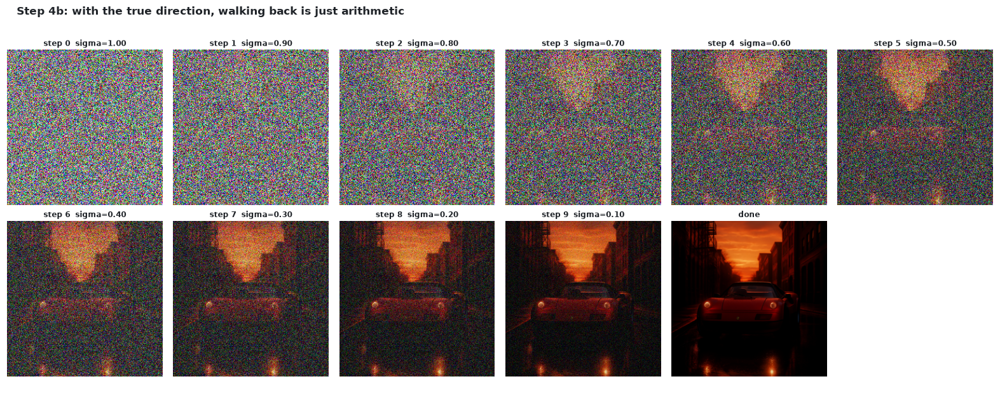

In [ ]:
fig = qv.plot_image_grid(walk + [show(x)],
                         [f"step {i}  sigma={sigmas_toy[i]:.2f}" for i in range(STEPS)] + ["done"],
                         ncols=6,
                         suptitle="Step 4b: with the true direction, walking back is just arithmetic")
qv.save(fig, "guide_04b_oracle_walk")
plt.show()

**结论**：去噪循环本身没有任何魔法，就是「**问方向 → 走一步**」重复 10 次。
真正被训练出来的能力主要为 —— **只看着当前这堆数 x（看不到干净图），把方向 v 猜出来**。
这就是那 20B 参数的 transformer 唯一的工作。

（上面的反推导版之所以能几乎一步不差走回去，是因为 v 处处相同；但是真实情况下模型每一步给出的 v
都不一样，所以轨迹是弯的 —— §10 会看到真实的每一步。）

---
## 5. 模型其实没在看像素：VAE 把图压小 12 倍

1024×1024 的图有 300 多万个数。在这个尺寸上跑 20 次 transformer 前向，计算量大到不现实。
**因此计算都在一个压缩空间里做。** 负责压缩和还原的就是 VAE。

这一节把上面那张图压进去、再还原出来，看看损失了什么。

In [ ]:
# ============================================================
# 看 VAE：图片 → latent → 图片
# ============================================================


# ------------------------------------------------------------
# 1. 把图片转换成模型可以处理的数字
# ------------------------------------------------------------

# image_pipe 是刚才生成的 PIL 图片。
#
# 原始像素范围：
#   [0, 255]
#
# 转换成模型使用的：
#   [-1, 1]
#
# shape：
#   [1024, 1024, 3]
#    高     宽    RGB
arr = np.asarray(image_pipe, dtype=np.float32) / 127.5 - 1.0


# ------------------------------------------------------------
# 2. 把普通数组变成 PyTorch Tensor，并调整 shape
# ------------------------------------------------------------

# 原来：
# [1024, 1024, 3]
#
# permute(2, 0, 1) 后：
# [3, 1024, 1024]
#
# [None, :, None] 再增加两个维度：
# [1, 3, 1, 1024, 1024]
#
# 可以简单理解为：
# 1 个样本 × 3 个 RGB 通道 × 1 帧 × 高 × 宽

x_pix = torch.from_numpy(arr).permute(2, 0, 1)[None, :, None]


# ------------------------------------------------------------
# 3. 把图片数据放到 GPU
# ------------------------------------------------------------

# DEVICE = "cuda"：
# 把数据送到 NVIDIA GPU。
#
# pipe.vae.dtype：
# 同时把数据类型调整成 VAE 使用的数据类型。
x_pix = x_pix.to(DEVICE, pipe.vae.dtype)


# ------------------------------------------------------------
# 4. VAE：图片 → latent → 图片
# ------------------------------------------------------------

# 我们这里只是在观察 VAE，不需要训练模型，
# 所以关闭梯度计算，减少显存和计算开销。
with torch.no_grad():

    # VAE Encoder：
    #
    # 图片
    # [1, 3, 1, 1024, 1024]
    #
    #       ↓ encode
    #
    # latent
    # [1, 16, 1, 128, 128]
    #
    # 也就是把 1024×1024 的空间压缩成 128×128。
    latent = pipe.vae.encode(x_pix).latent_dist.mode()

    # VAE Decoder：
    #
    # latent
    #       ↓ decode
    # 重新还原成图片
    back = pipe.vae.decode(latent, return_dict=False)[0]


# ------------------------------------------------------------
# 5. 看看压缩前后的 shape
# ------------------------------------------------------------

print(
    "像素   ",
    tuple(x_pix.shape),
    " = ",
    f"{x_pix.numel():,}",
    "个数"
)

print(
    "latent ",
    tuple(latent.shape),
    " = ",
    f"{latent.numel():,}",
    "个数"
)

print("还原   ", tuple(back.shape))

print()


# ------------------------------------------------------------
# 6. 计算 VAE 实际压缩了多少数字
# ------------------------------------------------------------

# 空间上：
#
# 1024×1024
#     ↓
# 128×128
#
# 高缩小 8 倍，宽也缩小 8 倍，
# 所以空间位置减少：
#
# 8 × 8 = 64 倍
#
# 但是：
#
# 图片每个位置只有 3 个数字（RGB）
# latent 每个位置有 16 个数字
#
# 所以真正的数字总量并没有减少 64 倍，
# 而是大约减少 12 倍。

print(
    f"压缩比 {x_pix.numel() / latent.numel():.1f}x"
    f"   （空间 8x8 = 64 倍，但通道从 3 变 16，"
    f"所以净压 {x_pix.numel()/latent.numel():.1f} 倍）"
)


# ------------------------------------------------------------
# 7. 把 VAE 还原出来的 Tensor 重新变成普通图片
# ------------------------------------------------------------

# back 的 shape：
# [1, 3, 1, 1024, 1024]
#
# back[0, :, 0]：
# 去掉 batch 和 frame 两个维度
#
# 得到：
# [3, 1024, 1024]
#
# permute(1, 2, 0)：
# 变回普通图片习惯的
# [1024, 1024, 3]
#
# 最后把 [-1,1] 转回 [0,255]

recon = (
    (back[0, :, 0]
     .float()
     .permute(1, 2, 0)
     .cpu()
     .numpy() + 1)
    * 127.5
)

recon = np.clip(recon, 0, 255).astype(np.uint8)


# 原始图片，用来和 VAE 还原结果比较
orig = np.asarray(image_pipe)


# ------------------------------------------------------------
# 8. 比较“原图”和“VAE 还原图”的误差
# ------------------------------------------------------------

print()

print(
    f"还原误差  最大 "
    f"{np.abs(orig.astype(np.int16) - recon.astype(np.int16)).max()}/255"
    f"   平均 "
    f"{np.abs(orig.astype(np.int16) - recon.astype(np.int16)).mean():.2f}/255"
)

像素    (1, 3, 1, 1024, 1024)  =  3,145,728 个数
latent  (1, 16, 1, 128, 128)  =  262,144 个数
还原    (1, 3, 1, 1024, 1024)

压缩比 12.0x   （空间 8x8 = 64 倍，但通道从 3 变 16，所以净压 12.0 倍）



还原误差  最大 103/255   平均 0.33/255


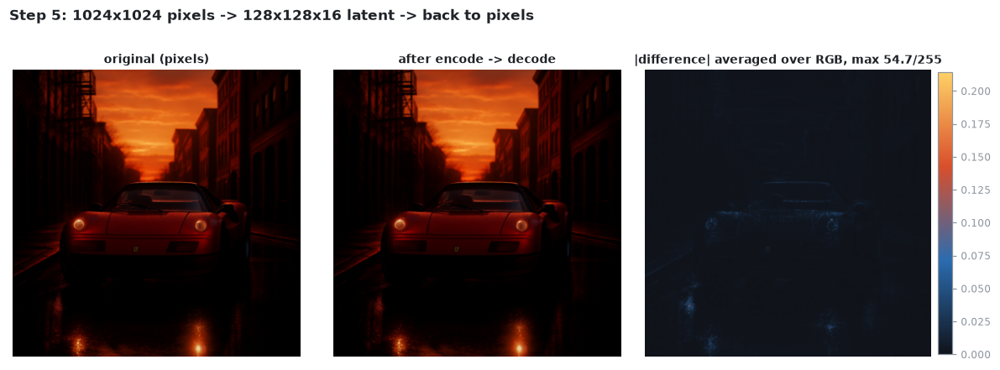

In [ ]:
# ============================================================
# 把 VAE 压缩前后的图片画出来进行比较
# ============================================================


# ------------------------------------------------------------
# 1. 画出“原图 vs VAE 还原图”
# ------------------------------------------------------------

# qv.plot_vae_roundtrip() 是我们自己写的画图函数。
#
# orig  ：进入 VAE 之前的原始图片
# recon ：经过
#         图片 → VAE Encoder → latent
#              → VAE Decoder → 图片
#         之后得到的还原图片
#
# 把两张图片放在一起，就可以直接观察
# VAE 压缩和还原造成了多少信息损失。

fig = qv.plot_vae_roundtrip(
    orig,
    recon,
    "Step 5: 1024x1024 pixels -> 128x128x16 latent -> back to pixels"
)


# ------------------------------------------------------------
# 2. 保存比较图
# ------------------------------------------------------------

qv.save(fig, "guide_05_vae_roundtrip")


# ------------------------------------------------------------
# 3. 在 Jupyter Notebook 中显示
# ------------------------------------------------------------

plt.show()

**结论**：压掉 12 倍，**平均误差不到 1/255**，肉眼看上去整张图看过去和原图没区别。但右边那张差异图会告诉你
损失在哪 —— 最大误差可能上百，全部落在**边缘和高频纹理**上（例如车身轮廓，路面反光）。
压缩不是无损的，它丢的是"最难压的那部分细节"。
这就是整个方法成立的前提 —— **去噪循环全程在 128×128 的格子上跑，从来没碰过 1024×1024 的像素。**
只有最后一步才把 latent 翻译回像素，而那只占总耗时的 0.79%（§13）。

> 注意这里的 latent 和 §7 那堆噪声是**同一个空间里的东西**：形状都是 `[1, 16, 1, 128, 128]`。
> 生成就是在这个空间里，从随机数走到一个"能被 VAE 翻译成好图"的点。

---
## 6. 提示词怎么变成模型能用的东西

Qwen-Image模型不直接读字符串。三步：**套模板 → 切成 token → 每个 token 变成一条向量**。

第一步有点意外：pipeline 先把你的句子塞进一段固定的"请描述图像的颜色、形状、纹理…"
指令里，编码完之后**再把模板前缀那 34 个 token 的结果扔掉**。

In [ ]:
# ============================================================
# 看看 Prompt 是怎样被 Qwen-Image 处理成 token 的
# ============================================================


# ------------------------------------------------------------
# 1. 读取 Qwen-Image 设置的起始位置
# ------------------------------------------------------------

# Qwen-Image 不会直接把我们写的 PROMPT 原封不动送进去。
# 它会先在 prompt 前后加入一个固定模板。
#
# prompt_template_encode_start_idx 告诉我们：
# 模板处理完成以后，从第几个 token 开始保留。
#
# 当前版本源码中这个值是 34。
DROP = pipe.prompt_template_encode_start_idx


# ------------------------------------------------------------
# 2. 给我们的 Prompt 套上 Qwen-Image 的固定模板
# ------------------------------------------------------------

# 原来我们只有：
#
# "A red sports car parked..."
#
# Qwen-Image 会把它放进一个更完整的固定模板中，
# 再交给 tokenizer。
templated = pipe.prompt_template_encode.format(PROMPT)


# ------------------------------------------------------------
# 3. 把文字转换成 token ID
# ------------------------------------------------------------

# tokenizer：
#     文字 → token → token ID
#
# return_tensors="pt"：
#     直接返回 PyTorch Tensor。
#
# input_ids[0]：
#     这里只有一个 prompt，所以取出第一个样本。

input_ids = pipe.tokenizer(
    templated,
    return_tensors="pt"
).input_ids[0]


# ------------------------------------------------------------
# 4. 把 token ID 转回可读的 token
# ------------------------------------------------------------

# 模型内部真正使用的是 token ID，例如：
#
# [151644, 8948, 198, ...]
#
# 为了方便我们观察，
# convert_ids_to_tokens() 把它们转换回 token 的文字形式。

tokens = pipe.tokenizer.convert_ids_to_tokens(input_ids)


# ------------------------------------------------------------
# 5. 去掉前面的固定模板 token
# ------------------------------------------------------------

# 前 DROP=34 个 token 属于模板前缀。
#
# 从第 34 个 token 开始，
# 才是后面真正保留下来的部分。

kept_tokens = tokens[DROP:]


# ------------------------------------------------------------
# 6. 打印 token 数量
# ------------------------------------------------------------

print(f"套模板后 token 总数 : {len(tokens)}")

print(f"扔掉的前缀         : {DROP}")

print(f"真正当条件用的     : {len(kept_tokens)}")

print()


# ------------------------------------------------------------
# 7. 看看前 34 个 token 到底是什么
# ------------------------------------------------------------

print("--- 扔掉的部分 ---")

# decode()：
# token ID → 人能读懂的文字
#
# 所以这里可以直接看到被去掉的模板前缀。
print(
    pipe.tokenizer.decode(
        input_ids[:DROP]
    )
)


# ------------------------------------------------------------
# 8. 看看最终保留下来的部分
# ------------------------------------------------------------

print("--- 留下的部分 ---")

# 查看从第 34 个 token 开始保留下来的文字。
print(
    pipe.tokenizer.decode(
        input_ids[DROP:]
    )
)

套模板后 token 总数 : 61
扔掉的前缀         : 34
真正当条件用的     : 27

--- 扔掉的部分 ---
<|im_start|>system
Describe the image by detailing the color, shape, size, texture, quantity, text, spatial relationships of the objects and background:<|im_end|>
<|im_start|>user

--- 留下的部分 ---
A red sports car parked on a quiet city street at sunset, with realistic lighting and reflections on wet pavement.<|im_end|>
<|im_start|>assistant



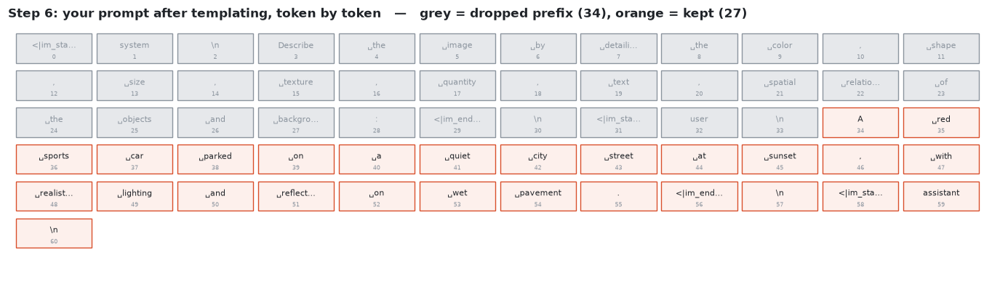

In [ ]:
# ============================================================
# 把 Prompt 的 token 可视化
# ============================================================


# ------------------------------------------------------------
# 1. 把所有 token 画出来
# ------------------------------------------------------------

# qv.plot_token_strip() 是我们自己写的可视化函数。
#
# tokens：
#   套完模板后得到的所有 token
#
# DROP：
#   前多少个 token 对应模板前缀。
#   当前 DROP = 34
#
# 画出来以后，可以直观看到：
#
# [模板 token ...] [保留下来的 token ...]
#  ↑ 前 34 个          ↑ 后面的部分

fig = qv.plot_token_strip(
    tokens,
    DROP,
    "Step 6: your prompt after templating, token by token"
)


# ------------------------------------------------------------
# 2. 保存图片
# ------------------------------------------------------------

qv.save(fig, "guide_06_tokens")


# ------------------------------------------------------------
# 3. 在 Notebook 中显示
# ------------------------------------------------------------

plt.show()

模板的作用是"把模型的状态推向描述图像"，但模板本身不该出现在画面里，所以编码完就丢掉。
接着，留下的每个 token 各变成一条 3584 维的向量。

In [ ]:
# ============================================================
# Text Encoder：把 token 变成模型能够理解的数字向量
# ============================================================


# ------------------------------------------------------------
# 1. 编码正面 Prompt
# ------------------------------------------------------------

# 这里只是在运行已经训练好的模型，不需要训练，
# 所以关闭梯度计算。
with torch.no_grad():

    # encode_prompt() 会完成：
    #
    # Prompt
    #   ↓
    # Tokenizer
    #   ↓
    # token
    #   ↓
    # Text Encoder
    #   ↓
    # 每个 token → 一个 3584 维向量
    #
    # prompt_embeds：
    #   最终得到的文字数字表示
    #
    # prompt_embeds_mask：
    #   告诉模型哪些位置是真正的文字，
    #   哪些位置只是为了补齐长度而添加的 padding

    prompt_embeds, prompt_embeds_mask = pipe.encode_prompt(
        prompt=PROMPT,
        device=DEVICE,
        num_images_per_prompt=1,
        max_sequence_length=MAX_SEQUENCE_LENGTH
    )


    # --------------------------------------------------------
    # 2. 用完全相同的方法编码 Negative Prompt
    # --------------------------------------------------------

    negative_embeds, negative_embeds_mask = pipe.encode_prompt(
        prompt=NEGATIVE_PROMPT,
        device=DEVICE,
        num_images_per_prompt=1,
        max_sequence_length=MAX_SEQUENCE_LENGTH
    )


# ------------------------------------------------------------
# 3. 看看 Text Encoder 输出的 shape
# ------------------------------------------------------------

print(
    "正面提示词 ",
    tuple(prompt_embeds.shape),
    prompt_embeds.dtype,
    "  [1, token 数, 3584]"
)

print(
    "负面提示词 ",
    tuple(negative_embeds.shape)
)

print()


# ------------------------------------------------------------
# 4. 3584 是什么意思？
# ------------------------------------------------------------

# 每一个保留下来的 token，
# Text Encoder 都会把它表示成一个 3584 维向量。
#
# 可以简单理解为：
#
# token "car"
#      ↓ Text Encoder
# [0.21, -0.83, 0.14, ...]
# └──────── 3584 个数字 ────────┘
#
# Transformer 后面真正读取的不是 "car" 这个字符串，
# 而是这个 3584 维的数字表示。

print(
    "3584 = 文本编码器的隐藏维度 =",
    pipe.transformer.config.joint_attention_dim
)


# ------------------------------------------------------------
# 5. 检查 token 数是否对应
# ------------------------------------------------------------

# 上一节我们算出了最终保留下来的 token 数。
#
# 这里检查 Text Encoder 输出的向量数量是否与它一致。
#
# 如果保留 27 个 token：
#
# prompt_embeds.shape = [1, 27, 3584]
#
# 意思就是：
#
# 1 个 Prompt
# × 27 个 token
# × 每个 token 用 3584 个数字表示

print(
    "序列长度",
    prompt_embeds.shape[1],
    "== 上面留下的 token 数",
    len(kept_tokens)
)

正面提示词  (1, 27, 3584) torch.bfloat16   [1, token 数, 3584]
负面提示词  (1, 10, 3584)

3584 = 文本编码器的隐藏维度 = 3584
序列长度 27 == 上面留下的 token 数 27


**结论**：你的一句话最后变成 **27 条 3584 维向量**。
保留整条序列是关键 —— 图像的不同区域才能分别去"看"不同的词，
"红色跑车"里的 red 才能只作用在车身上，而不是让整张图泛红。**§11 会把这件事画出来。**

---
## 7. 起点：一堆随机数，和决定它的 seed

现在把 §4 的道理搬到真实模型上。起点不是白纸，是**在 latent 空间里随机抽一把数**。
抽哪一把由 `seed` 决定。

In [ ]:
# ============================================================
# 创建图片生成的起点：随机 latent 噪声
# ============================================================


# ------------------------------------------------------------
# 1. 确定 latent 有多少个通道
# ------------------------------------------------------------

# Qwen-Image 的 latent 每个格子是一个 16 维向量，
# 所以这里最终会得到：
#
# num_channels_latents = 16
#
# 为什么源码这里要 // 4，
# 和后面“2×2 latent 格子打包成一个 image token”有关。
num_channels_latents = pipe.transformer.config.in_channels // 4


# ------------------------------------------------------------
# 2. 创建随机数生成器
# ------------------------------------------------------------

# Qwen-Image 生成图片时不是从空白图片开始，
# 而是从一堆随机数字开始。
#
# 固定 SEED=42，
# 可以让我们每次得到相同的初始随机噪声，
# 方便重复实验。
generator = torch.Generator(
    device=DEVICE
).manual_seed(SEED)


# ------------------------------------------------------------
# 3. 创建初始随机 latent
# ------------------------------------------------------------

# prepare_latents() 根据：
#
#   图片大小
#   latent 通道数
#   数据类型
#   GPU
#   随机种子
#
# 创建生成过程最开始的随机 latent。
#
# 注意：
# prepare_latents() 返回的是已经打包成 image token 的形式，
# 后面我们再把它拆回 128×128 的 latent 网格，
# 这样更容易观察。

initial_latents = pipe.prepare_latents(
    1,                      # 一次生成 1 张图片
    num_channels_latents,   # latent 通道数
    HEIGHT,                 # 最终图片高度
    WIDTH,                  # 最终图片宽度
    prompt_embeds.dtype,    # 使用和文字 embedding 相同的数据类型
    DEVICE,                 # 放在 GPU 上
    generator               # 使用刚才固定 seed 的随机数生成器
)


# ------------------------------------------------------------
# 4. 把 image token 拆回 latent 网格
# ------------------------------------------------------------

# prepare_latents() 得到的是打包后的形式。
#
# _unpack_latents() 把它重新展开，
# 方便我们看到真正的 latent 空间结构：
#
# [1, 16, 1, 128, 128]
#
# 可以理解为：
#
# 1 张图片
# × 128×128 个 latent 格子
# × 每个格子一个 16 维向量

noise_grid = pipe._unpack_latents(
    initial_latents,
    HEIGHT,
    WIDTH,
    pipe.vae_scale_factor
)


# ------------------------------------------------------------
# 5. 看看随机 latent 的 shape
# ------------------------------------------------------------

print(
    "图像尺寸       ",
    (HEIGHT, WIDTH),
    "像素"
)

print(
    "latent 网格    ",
    tuple(noise_grid.shape),
    "  [批, 通道, 时间, 高, 宽]"
)


# ------------------------------------------------------------
# 6. 和 §5 的 VAE latent 比较
# ------------------------------------------------------------

# §5：
#
# 一张真实图片
#      ↓ VAE Encoder
# [1, 16, 1, 128, 128]
#
# 现在：
#
# 随机噪声
#      ↓
# [1, 16, 1, 128, 128]
#
# 两者 shape 完全一样。
#
# 这非常重要：
# Transformer 的任务就是在这个相同的 latent 空间中，
# 把“随机 latent”逐渐变成“有意义的 latent”。

print(
    "和 §5 压出来的 latent 同形状:",
    tuple(noise_grid.shape) == tuple(latent.shape)
)

print()


# ------------------------------------------------------------
# 7. 看看这些随机数的统计特征
# ------------------------------------------------------------

# 初始 latent 来自随机噪声。
#
# 标准正态分布大致具有：
#
# 平均值 ≈ 0
# 标准差 ≈ 1
#
# 此时这些数字还没有组成任何有意义的图片。

print(
    f"噪声统计: "
    f"均值 {noise_grid.float().mean():+.4f}  "
    f"标准差 {noise_grid.float().std():.4f}"
    "   <- 标准正态分布，没有任何图像信息"
)

图像尺寸        (1024, 1024) 像素
latent 网格     (1, 16, 1, 128, 128)   [批, 通道, 时间, 高, 宽]
和 §5 压出来的 latent 同形状: True

噪声统计: 均值 -0.0021  标准差 0.9977   <- 标准正态分布，没有任何图像信息


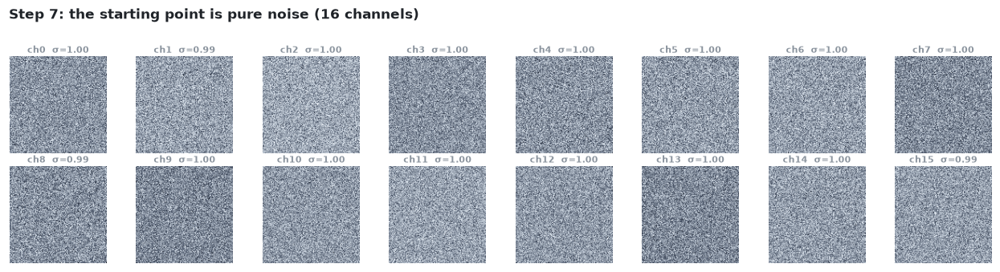

In [ ]:
fig = qv.plot_latent_channels(noise_grid, "Step 7: the starting point is pure noise (16 channels)")
qv.save(fig, "guide_07a_noise")
plt.show()

**换个 seed，换一堆随机数，同一句话就出另一张图。** 下面把 seed 从 42 改成 1234，
prompt 一个字没改。

用时 32.8s


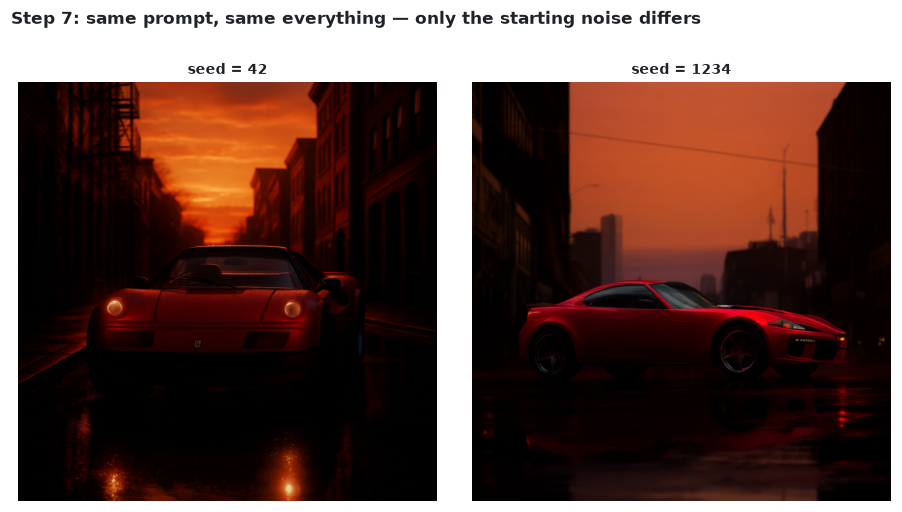

In [ ]:
# ============================================================
# Seed 实验：
# 相同 Prompt + 相同参数，只改变初始随机噪声
# ============================================================


# ------------------------------------------------------------
# 1. 用另一个 seed 再生成一次
# ------------------------------------------------------------

# 记录开始时间
t0 = time.time()


# 和之前完全一样地调用 Qwen-Image。
#
# 唯一改变的是：
#
# 原来：SEED = 42
# 现在：SEED = 1234
#
# seed 不同
#    ↓
# 初始随机 latent 不同
#    ↓
# Transformer 的生成起点不同
#    ↓
# 最终图片也会不同

image_seed_other = pipe(

    # Prompt 完全相同
    prompt=PROMPT,

    # Negative Prompt 完全相同
    negative_prompt=NEGATIVE_PROMPT,

    # 图片尺寸完全相同
    width=WIDTH,
    height=HEIGHT,

    # 去噪步数完全相同
    num_inference_steps=STEPS,

    # CFG 完全相同
    true_cfg_scale=TRUE_CFG_SCALE,

    # 唯一改变的地方：
    # 使用 seed = 1234 生成另一份初始随机噪声
    generator=torch.Generator(
        device=DEVICE
    ).manual_seed(1234),

).images[0]


# ------------------------------------------------------------
# 2. 打印生成时间
# ------------------------------------------------------------

print(f"用时 {time.time() - t0:.1f}s")


# ------------------------------------------------------------
# 3. 把两个 seed 生成的图片放在一起比较
# ------------------------------------------------------------

# image_pipe：
#   前面使用 seed = 42 生成的图片
#
# image_seed_other：
#   现在使用 seed = 1234 生成的图片
#
# 两张图片使用完全相同的 Prompt 和生成参数，
# 只有初始随机噪声不同。

fig = qv.plot_image_row(

    # 要显示的两张图片
    [image_pipe, image_seed_other],

    # 每张图片下面的标签
    [f"seed = {SEED}", "seed = 1234"],

    # 整张比较图的标题
    "Step 7: same prompt, same everything — only the starting noise differs",

    # 图的显示高度
    height=4.2
)


# ------------------------------------------------------------
# 4. 保存并显示比较图
# ------------------------------------------------------------

qv.save(fig, "guide_07b_seeds")

plt.show()

**结论**：prompt 决定"画什么"，seed 决定"具体画成哪一张"。两张都符合提示词，
但车型、角度、街景细节完全不同。 **没在 prompt 里写的东西，全部由那堆随机数决定**。
固定 seed 就能复现，这也是这份 notebook 每一节都能对上号的原因。

---
## 8. 打包：把方格子到 token

Transformer 只认**序列**（一串 token），不认二维网格。所以 latent 网格要先切成 2×2 的小块，
每块的 16 通道 × 4 格 = 64 个数拼成一个 token。

In [ ]:
print("打包前 ", tuple(noise_grid.shape),      "  [批, 16 通道, 1, 128, 128]  <- 网格")
print("打包后 ", tuple(initial_latents.shape), "  [批, token 数, 64]          <- 序列")
print()
print(f"token 数 = (高//16) x (宽//16) = {HEIGHT//16} x {WIDTH//16} = {initial_latents.shape[1]}")
print(f"token 宽 = 16 通道 x 2 x 2     = {initial_latents.shape[2]}")
print(f"那个 16  = VAE 压缩 {pipe.vae_scale_factor} 倍  x  打包再合并 2 倍")

repacked = pipe._pack_latents(noise_grid, 1, num_channels_latents,
                              noise_grid.shape[-2], noise_grid.shape[-1])
print()
print("打包是纯重排，一个数都没丢。pack(unpack(x)) 与 x 的最大差:",
      float((repacked.float() - initial_latents.float()).abs().max()))

打包前  (1, 16, 1, 128, 128)   [批, 16 通道, 1, 128, 128]  <- 网格
打包后  (1, 4096, 64)   [批, token 数, 64]          <- 序列

token 数 = (高//16) x (宽//16) = 64 x 64 = 4096
token 宽 = 16 通道 x 2 x 2     = 64
那个 16  = VAE 压缩 8 倍  x  打包再合并 2 倍

打包是纯重排，一个数都没丢。pack(unpack(x)) 与 x 的最大差: 0.0


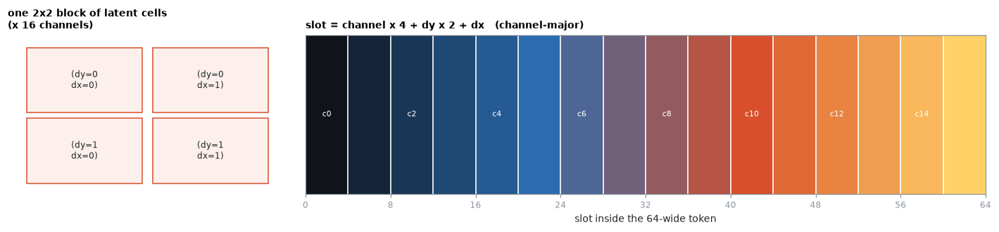

In [ ]:
# ============================================================
# Step 8：可视化 latent 是怎样被打包成 image token 的
# ============================================================


# ------------------------------------------------------------
# 1. 画出 2×2 latent 打包过程
# ------------------------------------------------------------

# qv.plot_packing_map() 是我们自己写的可视化函数。
#
# 它用示意图展示：
#
# latent 网格中的 2×2 个相邻格子
#
#   [A] [B]
#   [C] [D]
#
# 会被合并成 Transformer 的 1 个 image token。
#
# 每个 latent 格子有 16 个数字，
# 所以：
#
# 4 个格子 × 16
# = 64 个数字
#
# 因此一个 image token 的宽度是 64。

fig = qv.plot_packing_map()


# ------------------------------------------------------------
# 2. 保存示意图
# ------------------------------------------------------------

qv.save(fig, "guide_08_packing")


# ------------------------------------------------------------
# 3. 在 Notebook 中显示
# ------------------------------------------------------------

plt.show()

In [ ]:
# ============================================================
# 分辨率越高，Transformer 需要处理多少 image token？
# ============================================================


# ------------------------------------------------------------
# 1. 把 1024×1024 作为基准
# ------------------------------------------------------------

# 前面已经知道：
#
# 最终图片每 16×16 像素
# 对应 Transformer 的 1 个 image token。
#
# 所以 1024×1024 图片：
#
# 1024 / 16 = 64
#
# token 网格：
#
# 64 × 64 = 4096 个 token

base = (1024 // 16) ** 2


print("分辨率        token 数    token 数倍率   注意力计算量倍率")


# ------------------------------------------------------------
# 2. 比较不同图片分辨率
# ------------------------------------------------------------

for res in [512, 1024, 2048]:

    # 计算该分辨率对应的 image token 数量
    #
    # 例如 512×512：
    #
    # 512 / 16 = 32
    # 32 × 32 = 1024 tokens
    n = (res // 16) ** 2


    # n / base：
    # token 数相对于 1024×1024 的倍率
    #
    # (n / base)^2：
    # 用最简单的全注意力 O(N²) 模型，
    # 粗略展示 token 数增加对 attention 计算的影响。

    print(
        f"{f'{res}x{res}':<12}"
        f"{n:>8,}"
        f"{n/base:>12.2f}"
        f"{(n/base)**2:>15.2f}"
    )


print()

print(
    "（以 1024x1024 为 1 倍。"
    "注意力要让每个 token 看遍所有 token，"
    "所以计算量 ~ token 数的平方）"
)

分辨率        token 数    token 数倍率   注意力计算量倍率
512x512         1,024         0.25            0.06
1024x1024       4,096         1.00            1.00
2048x2048      16,384         4.00           16.00

（以 1024x1024 为 1 倍。注意力要让每个 token 看遍所有 token，所以计算量 ~ token 数的平方）


**结论**：1024×1024 = **4096 个 token**。token 数随边长**平方**增长，注意力计算量随 token 数
**再平方** —— 边长翻一倍，注意力开销 ×16。这就是高分辨率生成成本非常高的根本原因。

---
## 9. σ 时间表：循环开始前，先排好每一步走多远

§4 的玩具版里 σ 是均匀下降的（1.0, 0.9, 0.8 …）。真实的 pipeline 不这么排 ——
它先算一个和**图像大小有关**的系数，把时间表压弯 —— 压弯的方向和直觉相反：
**前面几步走得小，越往后单步越大**。

In [ ]:
# ============================================================
# Step 9：建立真正的去噪时间表（schedule）
# ============================================================

def build_schedule(num_steps):

    # --------------------------------------------------------
    # 1. 先建立一个基础 sigma 序列
    # --------------------------------------------------------

    # sigma 可以理解为：
    # 当前处于“多大噪声”的阶段。
    #
    # sigma 大 → 更接近随机噪声
    # sigma 小 → 更接近最终图片
    #
    # 这里先建立一个从 1 开始逐渐下降的基础序列。
    #
    # 例如 num_steps = 4：
    #
    # [1.00, 0.75, 0.50, 0.25]
    #
    # 注意：
    # 这还不是最终真正使用的 sigma schedule。
    sigmas = np.linspace(
        1.0,
        1 / num_steps,
        num_steps
    )


    # --------------------------------------------------------
    # 2. 根据 image token 数计算 shift
    # --------------------------------------------------------

    # initial_latents.shape[1]
    # 就是 Transformer 要处理的 image token 数。
    #
    # 对于 1024×1024：
    #
    # initial_latents.shape = [1, 4096, 64]
    #                            ↑
    #                         4096 tokens
    #
    # Qwen-Image 会根据图像 token 数调整时间表。
    #
    # mu 就是这个调整所需要的参数。
    mu = calculate_shift(
        initial_latents.shape[1],

        pipe.scheduler.config.get(
            "base_image_seq_len", 256
        ),

        pipe.scheduler.config.get(
            "max_image_seq_len", 4096
        ),

        pipe.scheduler.config.get(
            "base_shift", 0.5
        ),

        pipe.scheduler.config.get(
            "max_shift", 1.15
        ),
    )


    # --------------------------------------------------------
    # 3. 让 scheduler 建立真正使用的时间表
    # --------------------------------------------------------

    # retrieve_timesteps() 会把：
    #
    # 基础 sigma
    # + mu
    # + scheduler 配置
    #
    # 组合起来，建立真正的 denoising schedule。
    #
    # timesteps：
    #     每一步传给 Transformer / scheduler 的时间信息
    #
    # pipe.scheduler.sigmas：
    #     实际每一步对应的 sigma。

    timesteps, _ = retrieve_timesteps(
        pipe.scheduler,
        num_steps,
        DEVICE,
        sigmas=sigmas,
        mu=mu
    )


    # scheduler.sigmas 在 GPU Tensor 中。
    #
    # detach() → 不需要梯度
    # cpu()    → 搬到 CPU
    # numpy()  → 转成 NumPy
    # copy()   → 保存一份独立副本
    #
    # copy 很重要，因为下一次调用 build_schedule()
    # 会重新修改 scheduler 内部的 sigmas。

    return (
        timesteps,
        pipe.scheduler.sigmas
            .detach()
            .cpu()
            .numpy()
            .copy()
    )


# ============================================================
# 4. 比较不同去噪步数
# ============================================================

# 建立 4 步 schedule
timesteps_4, sigmas_4 = build_schedule(4)

# 建立 20 步 schedule
timesteps_20, sigmas_20 = build_schedule(20)

# 建立我们真正准备使用的 STEPS 步 schedule
#
# 这一句故意最后执行：
# 因为 build_schedule() 会修改 pipe.scheduler 内部状态。
#
# 后面的真正 denoising loop 要使用这一份 schedule。
timesteps_n, sigmas_n = build_schedule(STEPS)


# ============================================================
# 5. 打印每一步实际走多远
# ============================================================

print(f"{STEPS} 步的时间表：")

print(
    f"{'第几步':>6} "
    f"{'σ 现在':>10} "
    f"{'σ 下一步':>10} "
    f"{'这一步走多远':>14}"
)

for i in range(STEPS):

    # Δsigma = sigma_next - sigma_current
    #
    # 因为生成过程是从高 sigma → 低 sigma，
    # 所以这里通常是负数。
    #
    # 后面真正更新 latent 时，
    # scheduler 就会根据这个时间表往前推进。

    print(
        f"{i:>6} "
        f"{sigmas_n[i]:>10.4f} "
        f"{sigmas_n[i+1]:>10.4f} "
        f"{sigmas_n[i+1]-sigmas_n[i]:>14.4f}"
    )


print()


# ============================================================
# 6. 为什么 STEPS 步却有 STEPS+1 个 sigma？
# ============================================================

# 例如：
#
# sigma:
#
# σ0 → σ1 → σ2 → ... → σ10
#
#    1步   2步          10步
#
# 10 次移动需要 11 个位置。
#
# 最后 scheduler 会补上 sigma = 0，
# 表示走到 schedule 的终点。

print(
    f"σ 一共 {len(sigmas_n)} 个数 = 步数 + 1"
    "（末尾补了个 0）"
)


# ============================================================
# 7. 看看每一步的 sigma 间隔
# ============================================================

# np.diff：
#
# [σ0, σ1, σ2, ...]
#       ↓
# [σ1-σ0, σ2-σ1, ...]
#
# abs() 以后得到每一步 sigma 改变的大小。

gaps = np.abs(np.diff(sigmas_n))

half = STEPS // 2

print(
    f"第 0 步只走 {gaps[0]:.3f}，"
    f"第 {len(gaps)-2} 步走 {gaps[-2]:.3f}"
    " —— 越往后单步越大"
)

print(
    f"前 {half} 步一共只去掉 "
    f"{1-sigmas_n[half]:.0%} 的 sigma 区间，"
    f"剩下 {sigmas_n[half]:.0%} 留给后 {STEPS-half} 步"
)

10 步的时间表：
   第几步       σ 现在      σ 下一步         这一步走多远
     0     1.0000     0.9370        -0.0630
     1     0.9370     0.8670        -0.0700
     2     0.8670     0.7887        -0.0783
     3     0.7887     0.7006        -0.0881
     4     0.7006     0.6008        -0.0998
     5     0.6008     0.4867        -0.1141
     6     0.4867     0.3551        -0.1316
     7     0.3551     0.2015        -0.1536
     8     0.2015     0.0200        -0.1815
     9     0.0200     0.0000        -0.0200

σ 一共 11 个数 = 步数 + 1（末尾补了个 0：终点必须是干净图）
第 0 步只走 0.063，第 8 步走 0.182 —— 越往后单步越大
前 5 步一共只去掉 40% 的噪声，剩下 60% 留给后 5 步


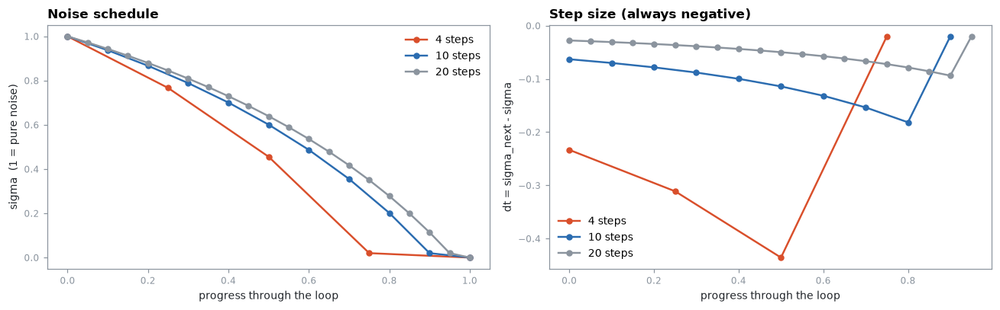

In [ ]:
fig = qv.plot_sigma_schedules({"4 steps": sigmas_4, f"{STEPS} steps": sigmas_n,
                               "20 steps": sigmas_20})
qv.save(fig, "guide_09_sigma")
plt.show()

**结论**：三条曲线**不是**同一条线上的取样 —— 构造时 `np.linspace(1.0, 1/N, N)` 里就带着 N，
步数不同，第一步落点就不同。所以**调步数不是"更精细地走同一条路"，是换了一条路**：
图会变，但是不只是变清楚。这一点在 §13 对比 10 步和 20 步时还会再看到。

另外注意步长的走向：**前 5 步只去掉四成噪声，剩下六成留给后 5 步**。
时间表故意在高噪声区域多停留 —— 因为构图就是在那里定下来的（§10 马上会看到）。

---
## 10. 去噪循环：整个生成过程只有这 4 行

前面 9 节都是准备。真正的生成就是下面这 4 行，重复 10 次：

```python
v_cond   = transformer(x, 你的 prompt)       # 前向 1：朝你要的方向
v_uncond = transformer(x, 负面 prompt)       # 前向 2：朝不想要的方向
v = v_uncond + 4.0 * (v_cond - v_uncond)     # CFG：把两者的差放大 4 倍
x = x + (σ_next - σ) * v                     # 沿这个方向走一步
```

对照 §4 的玩具版：第 4 行一模一样，区别只在 v 现在是**模型猜出来的**，不是作弊倒推出来的。

**为什么要问两次？** 一次带你的 prompt，一次带负面 prompt。两个答案的**差**就是
"提示词到底让画面改变了什么"，CFG 把这个差放大 4 倍再走。提示词的全部作用都在这个差里。

调 `pipe(...)` 只能拿到最后一张图，所以这里**手写**一遍这个循环，把每一步的中间结果都留下来。
（§14 会把手写的结果和 `pipe(...)` 逐像素比对，证明这不是一个"简化版"。）

In [ ]:
# ============================================================
# Step 10：手动运行 Qwen-Image 的 Transformer 去噪循环
# ============================================================


# ------------------------------------------------------------
# 1. 设置 Attention 记录器
# ------------------------------------------------------------

# Transformer 每一步都会计算 attention。
#
# 如果每一步、每一层都保存，会占用大量内存。
# 所以这里只保存：
#
# 第 0、1、4 和最后一步
#
# 保存下来的 attention 会在 §11 中分析。

ATTN_STEPS = [0, 1, 4, STEPS - 1]

store = qv.AttentionStore()

restore_attention = qv.install_attention_capture(
    pipe.transformer,
    CAPTURE_LAYERS,
    store
)


# ------------------------------------------------------------
# 2. 告诉 Transformer image token 的二维排列
# ------------------------------------------------------------

# VAE latent:
#
# 128 × 128
#
# 每 2×2 latent 格子打包成一个 image token：
#
# 64 × 64
#
# 所以对于 1024×1024 图片：
#
# img_shapes = [[(1, 64, 64)]]
#
# Transformer 虽然收到的是一串 4096 个 token，
# 但这里告诉它这些 token 原来对应怎样的二维图像结构。

img_shapes = [[(
    1,
    HEIGHT // pipe.vae_scale_factor // 2,
    WIDTH  // pipe.vae_scale_factor // 2
)]]


# ------------------------------------------------------------
# 3. 准备 denoising loop
# ------------------------------------------------------------

# 告诉 scheduler：
# 从时间表的第 0 步开始。
pipe.scheduler.set_begin_index(0)


# initial_latents 就是 §7 创建的随机噪声。
#
# clone()：
# 复制一份，因为我们不希望修改原来的 initial_latents。

latents = initial_latents.clone()


# 用来保存每一步的中间结果，
# 后面可以观察 latent、velocity 等是怎样变化的。

steps = []


# 开始计时
t0 = time.time()


# ============================================================
# 4. 正式开始 denoising loop
# ============================================================

for i, t in enumerate(timesteps_n):


    # --------------------------------------------------------
    # 4.1 当前 timestep 和 sigma
    # --------------------------------------------------------

    # Transformer 需要知道：
    # “我现在处于生成过程的哪个阶段？”
    #
    # timestep 就提供这个信息。

    timestep = t.expand(
        latents.shape[0]
    ).to(latents.dtype)


    # 当前 sigma
    sigma = float(
        pipe.scheduler.sigmas[i]
    )

    # 下一步 sigma
    sigma_next = float(
        pipe.scheduler.sigmas[i + 1]
    )


    # --------------------------------------------------------
    # 4.2 如果是指定步骤，开始记录 attention
    # --------------------------------------------------------

    if i in ATTN_STEPS:
        store.arm(f"step {i}")


    # ========================================================
    # 5. Transformer 前向传播 #1
    #    使用正面 Prompt
    # ========================================================

    # 输入：
    #
    # 当前 latent
    # + 当前 timestep
    # + 正面 Prompt embedding
    #
    # 输出：
    #
    # v_cond
    #
    # 可以简单理解成：
    #
    # “如果按照正面 Prompt，
    #  当前 latent 应该往哪个方向修改？”

    with torch.no_grad(), pipe.transformer.cache_context("cond"):

        v_cond = pipe.transformer(

            # 当前 image tokens
            hidden_states=latents,

            # 当前生成阶段
            timestep=timestep / 1000,

            guidance=None,

            # 正面 Prompt 哪些 token 有效
            encoder_hidden_states_mask=prompt_embeds_mask,

            # 正面 Prompt 的文字向量
            encoder_hidden_states=prompt_embeds,

            # image token 的二维结构
            img_shapes=img_shapes,

            attention_kwargs={},

            return_dict=False

        )[0]


    # 当前需要记录的 attention 已经抓完
    store.disarm()


    # ========================================================
    # 6. Transformer 前向传播 #2
    #    使用 Negative Prompt
    # ========================================================

    # 再对完全相同的 latent 运行一次 Transformer。
    #
    # 唯一主要区别：
    #
    # 第一次使用正面 Prompt
    # 第二次使用 Negative Prompt
    #
    # 得到 v_uncond。
    #
    # 这里变量沿用代码中的 uncond 命名；
    # 但当前实现实际传入的是 negative prompt embedding。

    with torch.no_grad(), pipe.transformer.cache_context("uncond"):

        v_uncond = pipe.transformer(

            hidden_states=latents,

            timestep=timestep / 1000,

            guidance=None,

            encoder_hidden_states_mask=negative_embeds_mask,

            encoder_hidden_states=negative_embeds,

            img_shapes=img_shapes,

            attention_kwargs={},

            return_dict=False

        )[0]


    # ========================================================
    # 7. TRUE CFG：加强正面 Prompt 的影响
    # ========================================================

    # 两次 Transformer 得到：
    #
    # v_cond   ：正面 Prompt 给出的方向
    # v_uncond ：Negative Prompt 给出的方向
    #
    # 两者差：
    #
    # v_cond - v_uncond
    #
    # 可以理解为：
    # “正面 Prompt 相对于 negative 分支增加的方向”。
    #
    # TRUE_CFG_SCALE > 1 把这个差异放大。

    combined = (
        v_uncond
        + TRUE_CFG_SCALE * (v_cond - v_uncond)
    )


    # --------------------------------------------------------
    # 8. 对 CFG 后的 velocity 做长度归一
    # --------------------------------------------------------

    # CFG 不仅会改变方向，也可能把向量长度放大很多。
    #
    # 这里把 combined 的长度重新调整，让它和 v_cond 的长度一致。
    #
    # 因此：
    #
    # CFG 主要改变方向
    # velocity 的整体长度保持接近 v_cond。

    v = combined * (
        torch.norm(v_cond, dim=-1, keepdim=True)
        /
        torch.norm(combined, dim=-1, keepdim=True)
    )


    # ========================================================
    # 9. 保存这一轮的信息
    # ========================================================

    # 为了后面分析，我们把当前：
    #
    # sigma
    # latent
    # velocity
    # conditional velocity
    # negative/unconditional velocity
    #
    # 全部保存下来。
    #
    # x0_hat：
    # 根据当前 latent + velocity
    # 估计最终 sigma=0 时的 latent 会是什么样。

    steps.append(
        dict(
            i=i,
            sigma=sigma,
            sigma_next=sigma_next,

            x_t=latents.clone(),

            v=v.clone(),

            v_cond=v_cond.clone(),

            v_uncond=v_uncond.clone(),

            x0_hat=qv.x0_from_velocity(
                latents,
                sigma,
                v
            )
        )
    )


    # ========================================================
    # 10. Scheduler 真正让 latent 前进一步
    # ========================================================

    # 到这里 Transformer 只是告诉我们：
    #
    # “应该往哪个方向走。”
    #
    # scheduler.step() 才真正根据：
    #
    # velocity
    # timestep / sigma schedule
    # 当前 latent
    #
    # 算出下一步 latent。

    latents = pipe.scheduler.step(
        v,
        t,
        latents,
        return_dict=False
    )[0]


# ============================================================
# 11. 去噪循环结束
# ============================================================

# STEPS 次更新以后，
# latents 就是最终得到的 latent。

final_latents = latents


# 恢复 Transformer 原来的 attention 实现，
# 不再继续抓取 attention。

restore_attention()


# ============================================================
# 12. 打印性能信息
# ============================================================

print(
    f"{STEPS} 步跑完，用时 {time.time()-t0:.1f}s；"
    f"transformer 前向 {STEPS} x 2 = {STEPS*2} 次"
)


# ============================================================
# 13. 看每一步 latent 和 velocity 怎样变化
# ============================================================

print()

print(
    f"{'步':>3} "
    f"{'σ':>8} "
    f"{'x 的标准差':>12} "
    f"{'v 的标准差':>12} "
    f"{'cos(v_cond, v_uncond)':>22}"
)


for s in steps:

    # cosine similarity：
    #
    # 比较正面 Prompt 和 Negative Prompt
    # 给出的两个 velocity 方向有多相似。
    #
    # cos ≈ 1：
    # 两个方向非常相似
    #
    # cos ≈ 0：
    # 两个方向差别很大
    #
    # cos ≈ -1：
    # 两个方向几乎相反

    cos = torch.nn.functional.cosine_similarity(
        s["v_cond"].float().flatten(),
        s["v_uncond"].float().flatten(),
        dim=0
    )

    print(
        f"{s['i']:>3} "
        f"{s['sigma']:>8.4f} "
        f"{s['x_t'].float().std():>12.4f} "
        f"{s['v'].float().std():>12.4f} "
        f"{float(cos):>22.4f}"
    )

10 步跑完，用时 31.8s；transformer 前向 10 x 2 = 20 次

  步        σ       x 的标准差       v 的标准差  cos(v_cond, v_uncond)


  0   1.0000       0.9977       1.0609                 0.9475
  1   0.9370       0.9562       1.1839                 0.9973
  2   0.8670       0.8902       1.1903                 0.9985
  3   0.7887       0.8198       1.1911                 0.9994
  4   0.7006       0.7460       1.1900                 0.9994
  5   0.6008       0.6733       1.1831                 0.9996
  6   0.4867       0.6091       1.1814                 0.9997
  7   0.3551       0.5675       1.1767                 0.9997
  8   0.2015       0.5732       1.1437                 0.9998
  9   0.0200       0.6493       0.8730                 0.9986


> 最后一列 `cos(v_cond, v_uncond)` 接近 1：带 prompt 和不带 prompt，模型给的方向本来就**很像**。
> CFG 做的就是把这点微小差异放大 4 倍。

### 每一步手上到底拿着什么

下面两组图，都是把当时的 latent 用 VAE 解码成 RGB 看的（§5 的 VAE 在这里当"显微镜"用）：

- **`x_t`**：循环里**真实**持有的那堆数。
- **`x0_hat = x_t − σ × v`**：把模型此刻给的方向一路外推到 σ=0，也就是
  **"模型现在认为成品长什么样"**。这个量在循环里不存在，是我们为了看懂它才算的。

In [ ]:
t0 = time.time()
xt_images = [qv.decode_packed(pipe, s["x_t"], HEIGHT, WIDTH) for s in steps]
x0_images = [qv.decode_packed(pipe, s["x0_hat"].to(torch.bfloat16), HEIGHT, WIDTH)
             for s in steps]
final_image = qv.decode_packed(pipe, final_latents, HEIGHT, WIDTH)   # 循环的成品，§11/§14 要用
print(f"解码 {2*STEPS+1} 次，用时 {time.time()-t0:.1f}s（只为了看，生成本身不需要这一步）")

解码 21 次，用时 15.6s（只为了看，生成本身不需要这一步）


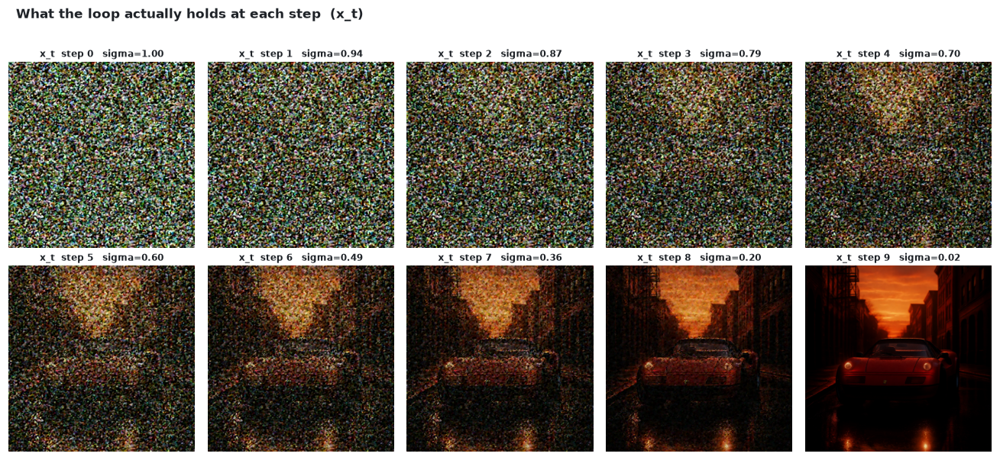

In [ ]:
fig = qv.plot_image_grid(
    xt_images, [f"x_t  step {s['i']}   sigma={s['sigma']:.2f}" for s in steps], ncols=5,
    suptitle="What the loop actually holds at each step  (x_t)")
qv.save(fig, "guide_10a_xt")
plt.show()

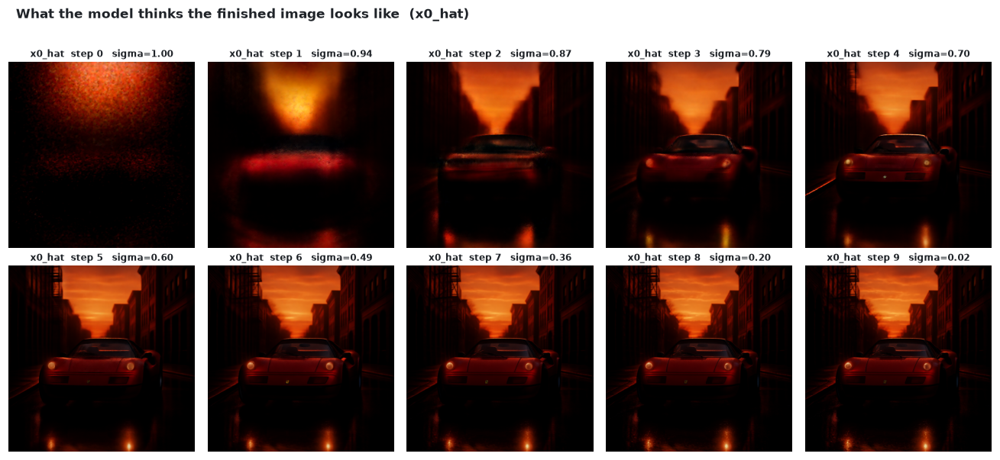

In [ ]:
fig = qv.plot_image_grid(
    x0_images, [f"x0_hat  step {s['i']}   sigma={s['sigma']:.2f}" for s in steps], ncols=5,
    suptitle="What the model thinks the finished image looks like  (x0_hat)")
qv.save(fig, "guide_10b_x0hat")
plt.show()

**结论**（全篇最重要的两组图）：

- **`x_t`**：前几步肉眼看就是噪点。循环里真正拿在手上的东西，要到很靠后才像一张图。
- **`x0_hat`**：**第 0 步、模型只看了一眼纯噪声，就已经给出了明暗和色调的大布局** ——
  上方亮（天空）、下方暗、中间偏下有一团红。第 1 步天空的光和车体的红块各就各位，
  第 2 步车和街道纵深已经成形。**后面 7 步，构图基本没有变，全在补细节和清晰度。**

所以：**构图在最前面两三步就定死了，加步数只能让细节变好，改不了布局。**
这条结论 §13 会用 10 步 vs 20 步再验证一次。

---
## 11. 文字到底怎么控制画面

到这里还有一件事没解释：4096 个图像 token 和 27 个文本 token，**是怎么连上的**？
答案是**注意力**（attention）：每个图像 token 每一层都会去"看"全部文本 token，
按相关程度分配权重。权重高的位置，就是那个词在起作用的地方。

这些权重平时**根本不存在** —— 现代实现把它们融合在算子内部，从不物化出来，任何 hook 都拿不到。
所以 §10 的循环里换了一个注意力处理器：照常调用融合算子产生真实输出（**数值一个不变**），
**另外**把图像 query 对文本 key 的 softmax 重算一遍存下来。

In [ ]:
# ============================================================
# 找出某个单词对应第几个 token
# ============================================================


# ------------------------------------------------------------
# 1. 定义一个查找 token 的函数
# ------------------------------------------------------------

def find_token(word):

    # kept_tokens 是 §6 中：
    # 去掉模板前缀以后，最终保留下来的 token。
    #
    # enumerate() 会同时给我们：
    #
    # j   = token 的位置
    # tok = token 本身
    #
    # 例如：
    #
    # j=5, tok="red"

    for j, tok in enumerate(kept_tokens):


        # ----------------------------------------------------
        # 清理 tokenizer 加入的特殊符号
        # ----------------------------------------------------

        # tokenizer 显示出来的 token 有时不完全等于我们看到的普通英文单词。
        #
        # 例如可能出现一些表示空格或换行的特殊字符。这里先把它们去掉，再比较："red" == 清理后的 token

        cleaned_tok = (
            tok
            .replace("Ġ", "")
            .replace("Ċ", "")
            .lower()
        )


        # ----------------------------------------------------
        # 找到了，就返回这个 token 的位置
        # ----------------------------------------------------

        if word.lower() == cleaned_tok:

            return j


    # --------------------------------------------------------
    # 如果整个 kept_tokens 都找不到
    # --------------------------------------------------------

    # 一个英文单词不一定对应一个 token。
    #
    # 例如某些单词可能被 tokenizer 拆成："pave" + "ment"
    #
    # 这种情况下，就找不到一个完全等于"pavement" 的单独 token。

    return None


# ============================================================
# 2. 查找几个我们关心的单词
# ============================================================

print("提示词里这些词各自是第几个 token：")


for word in [
    "red",
    "sports",
    "car",
    "street",
    "sunset",
    "pavement"
]:

    j = find_token(word)


    # 如果成功找到：
    #
    # red -> kept_tokens[...]
    #
    # 如果没有找到：
    #
    # pavement -> 不是单独一个 token

    print(
        f"  {word:<10} -> kept_tokens[{j}]"
        if j is not None
        else
        f"  {word:<10} -> 不是单独一个 token"
    )

提示词里这些词各自是第几个 token：
  red        -> kept_tokens[1]
  sports     -> kept_tokens[2]
  car        -> kept_tokens[3]
  street     -> kept_tokens[9]
  sunset     -> kept_tokens[11]
  pavement   -> kept_tokens[20]


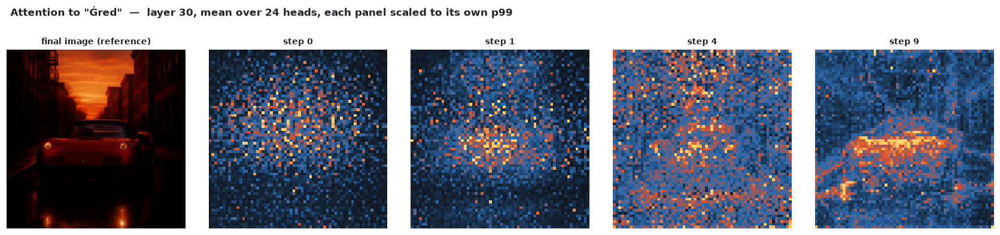

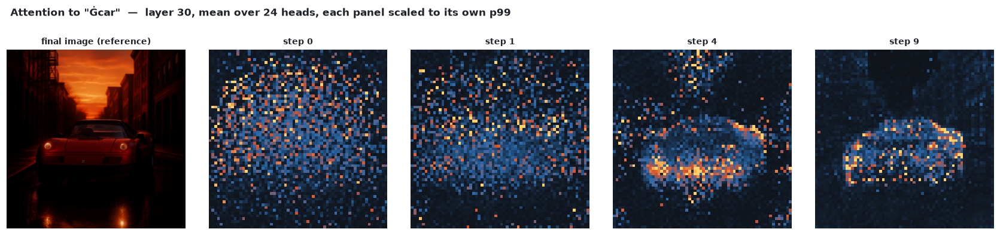

In [ ]:
LAYER = CAPTURE_LAYERS[1]
step_tags = [f"step {i}" for i in ATTN_STEPS]

for word in ["red", "car"]:
    j = find_token(word)
    fig = qv.plot_attention_steps(store, step_tags, LAYER, j, kept_tokens[j],
                                  TOKEN_GRID, final_image)
    qv.save(fig, f"guide_11a_attention_{word}")
    plt.show()

每个图像 token 把多少注意力分给了文本？只有 27 个文本 key，却要和 4096 个图像 key 竞争 ——
如果注意力是均匀分布的，文本只该拿到很小一点。

In [ ]:
# ============================================================
# Step 11：Transformer 到底有多关注文字？
# ============================================================


# ------------------------------------------------------------
# 1. 先计算“完全均匀 attention”的理论基准
# ------------------------------------------------------------

# Transformer 里同时存在两类 token：
#
#   text tokens  ：Prompt 的 token
#   image tokens ：图片 latent 打包后的 token
#
# 当前例子大约是：
#
#   text tokens  = 27
#   image tokens = 4096
#
# 如果 attention 完全平均，每一个 token 得到完全相同的注意力，
#
# 那么文字应该分到的 attention 比例就是：
#
#        text token 数
# --------------------------------
# text token 数 + image token 数

uniform = (
    prompt_embeds.shape[1]
    /
    (prompt_embeds.shape[1] + initial_latents.shape[1])
)


print(
    f"如果注意力均匀分布，"
    f"文本只该拿到 {uniform:.2%}\n"
)


# ------------------------------------------------------------
# 2. 查看不同 Transformer 层实际给文字多少 attention
# ------------------------------------------------------------

# CAPTURE_LAYERS = [10, 30, 50]
#
# 分别观察较浅、中间、较深的 Transformer 层。

for layer in CAPTURE_LAYERS:


    # store.maps[("step 0", layer)]
    #
    # 是我们在 Step 10 抓下来的 attention。
    #
    # 这里选择：
    #
    # step 0 = 去噪的第一步
    # layer  = 当前 Transformer 层

    attention_map = store.maps[("step 0", layer)]


    # sum(-1)：
    #
    # 把这个 map 中分给所有文字 token 的 attention 加起来。
    #
    # 得到每个 image token 总共有多少 attention 分配给文字。
    #
    # mean()： 再对所有 image token 求平均。
    #
    # 最终 share 可以理解为： “这一层平均有多少 attention 分给文字”

    share = float(
        attention_map.sum(-1).mean()
    )


    # --------------------------------------------------------
    # 3. 和“完全均匀分布”比较
    # --------------------------------------------------------

    print(
        f"  layer {layer:>2}   "
        f"实测 {share:>7.2%}   "
        f"= 均匀分布的 {share / uniform:>4.0f} 倍"
    )

如果注意力均匀分布，文本只该拿到 0.65%

  layer 10   实测  28.10%   = 均匀分布的   43 倍
  layer 30   实测  44.29%   = 均匀分布的   68 倍
  layer 50   实测  40.49%   = 均匀分布的   62 倍


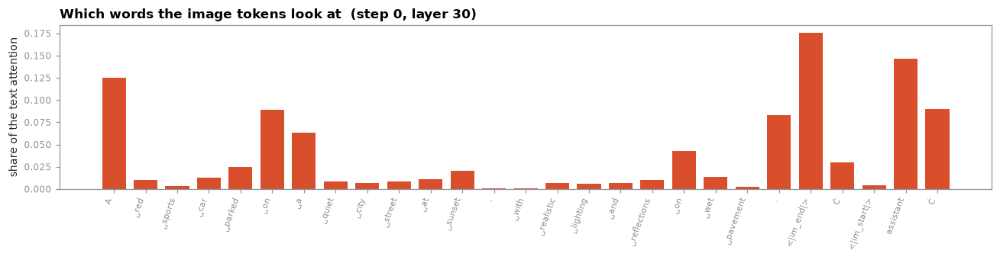

In [ ]:
fig = qv.plot_attention_mass(store, "step 0", LAYER, kept_tokens)
qv.save(fig, "guide_11b_attention_mass")
plt.show()

### CFG：提示词的力气用在哪

注意力说的是"看哪个词"。**真正把画面推过去的力**是 §10 里那个差 `v_cond − v_uncond`。
把它每个 token 的长度折回网格，就能看到**提示词在画面的哪些位置用力**。

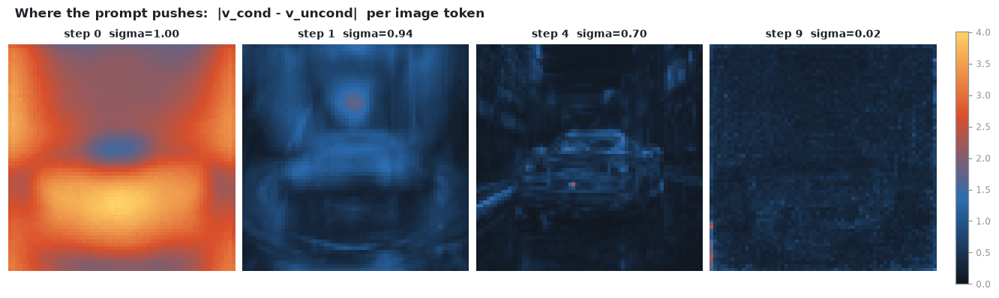

In [ ]:
sel = [s for s in steps if s["i"] in ATTN_STEPS]
mags = [(s["v_cond"] - s["v_uncond"])[0].float().norm(dim=-1).cpu().numpy() for s in sel]
fig = qv.plot_token_heatmaps(
    mags, [f"step {s['i']}  sigma={s['sigma']:.2f}" for s in sel],
    "Where the prompt pushes:  |v_cond - v_uncond|  per image token", TOKEN_GRID)
qv.save(fig, "guide_11c_cfg_difference")
plt.show()

**结论**（三条，都对着上面的图和数字看）：

1. **文本 token 少而重**。27 个文本 key 混在 4123 个 key 里，理论上均匀分布只该拿到 0.65%，
   实测拿走了 **28%~44%** —— 是均匀分布的 43~68 倍。图像的每个位置，每一层都在回头看你的句子。
2. **注意力是"逐渐对准"的**。第 0、1 步，`car` 的注意力还是散的；到第 4 步开始贴上车身，
   第 9 步清楚地勾出车的轮廓。**它跟着图像一起成形，不是一开始就知道车在哪。**
3. **CFG 的推力正好相反 —— 第一步最大，之后迅速衰减**。第 0 步整幅都在用力（最强的一块正是
   车将要出现的位置），第 4 步只剩车的轮廓且数值已经很小，第 9 步几乎归零。

把 2 和 3 合起来看：**第一步靠 CFG 的蛮力把大局定下来，后面几步靠注意力做局部精修。**
这和 §10 的 `x0_hat` 是同一件事的两个侧面。

> **注意力图能说什么、不能说什么**：它显示的是**相关**，删掉这个词图不一定会变。
> 另外少数图像 token 是"注意力汇"，数值比其余高一两个数量级，所以每个面板按自己的 p99 裁剪 ——
> **面板之间的绝对数值不可比**，可比的是每个面板内部的空间结构。

---
## 12. 收尾：解包 → 反归一化 → VAE 解码

循环出来的还是 4096 个 token。三步变回图片。

In [ ]:
unpacked = pipe._unpack_latents(final_latents, HEIGHT, WIDTH, pipe.vae_scale_factor)
print("1) 解包      ", tuple(final_latents.shape), "->", tuple(unpacked.shape),
      "  <- §8 打包的逆操作")

z_dim = pipe.vae.config.z_dim
lat = unpacked.to(pipe.vae.dtype)
mean = torch.tensor(pipe.vae.config.latents_mean).view(1, z_dim, 1, 1, 1).to(lat.device, lat.dtype)
inv_std = 1.0 / torch.tensor(pipe.vae.config.latents_std).view(1, z_dim, 1, 1, 1).to(lat.device, lat.dtype)
decode_input = lat / inv_std + mean
print(f"2) 反归一化   标准差 {lat.float().std():.3f} -> {decode_input.float().std():.3f}"
      "   <- 训练时按通道归一化过，解码前要还原")

with torch.no_grad():
    pixels = pipe.vae.decode(decode_input, return_dict=False)[0]
print("3) VAE 解码  ", tuple(decode_input.shape), "->", tuple(pixels.shape))
print()
print("VAE 把 128x128x16 个数放大成 1024x1024x3 个像素：一次性放大 64 倍面积。")
print()
print("上面三行就是 qv.decode_packed 做的事，§10 的每一张中间图都走的这条路。")

1) 解包       (1, 4096, 64) -> (1, 16, 1, 128, 128)   <- §8 打包的逆操作
2) 反归一化   标准差 0.662 -> 1.357   <- 训练时按通道归一化过，解码前要还原
3) VAE 解码   (1, 16, 1, 128, 128) -> (1, 3, 1, 1024, 1024)

VAE 把 128x128x16 个数放大成 1024x1024x3 个像素：一次性放大 64 倍面积。

上面三行就是 qv.decode_packed 做的事，§10 的每一张中间图都走的这条路。


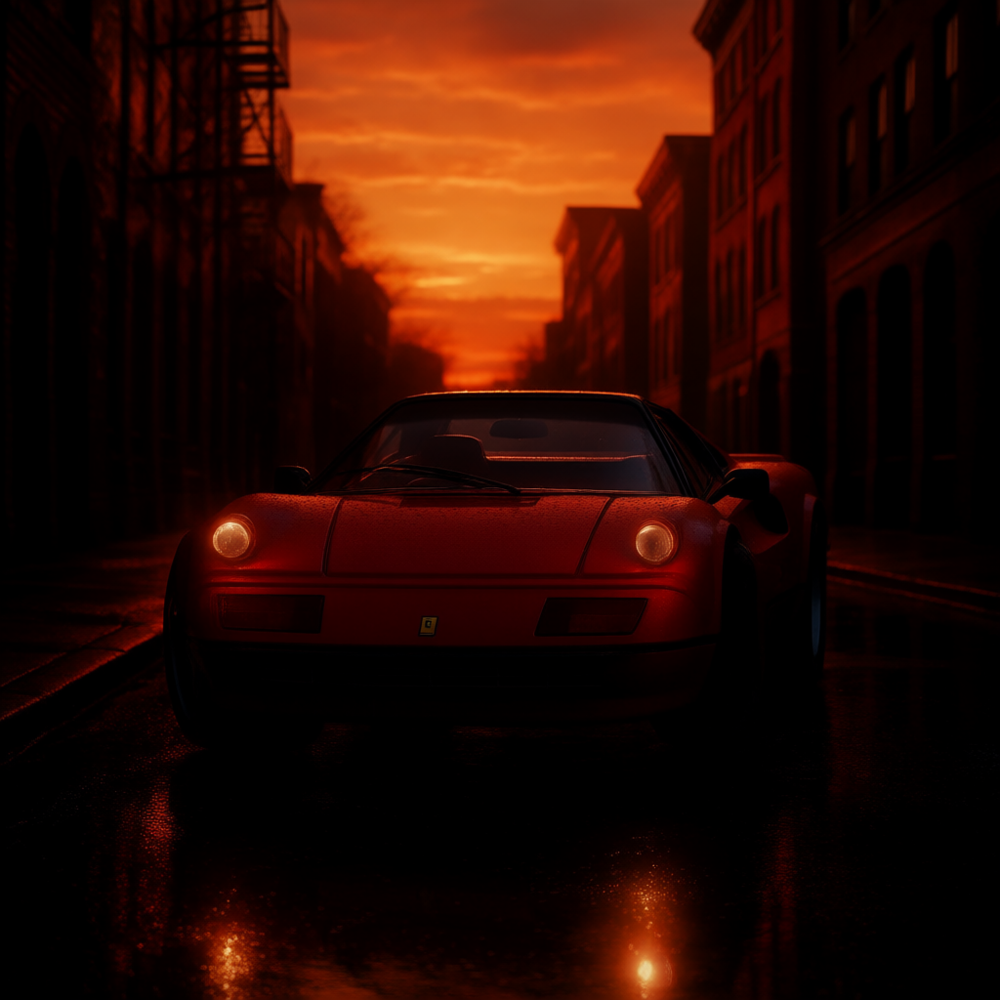

In [ ]:
display(final_image)
final_image.save(qv.RESULTS / f"guide_12_final_{STEPS}steps.png")

**结论**：从一句话到这张图，全部环节到此走完一遍。回头看 §0 那张链路图，现在每个箭头都见过了。

---
## 13. 三个旋钮：步数、CFG、分辨率

会用这三个参数，就能应付绝大多数实际情况。每个旋钮各买什么，下面用真实运行说话。

### 旋钮一：步数

20 步用时 63.1s（前向 40 次）


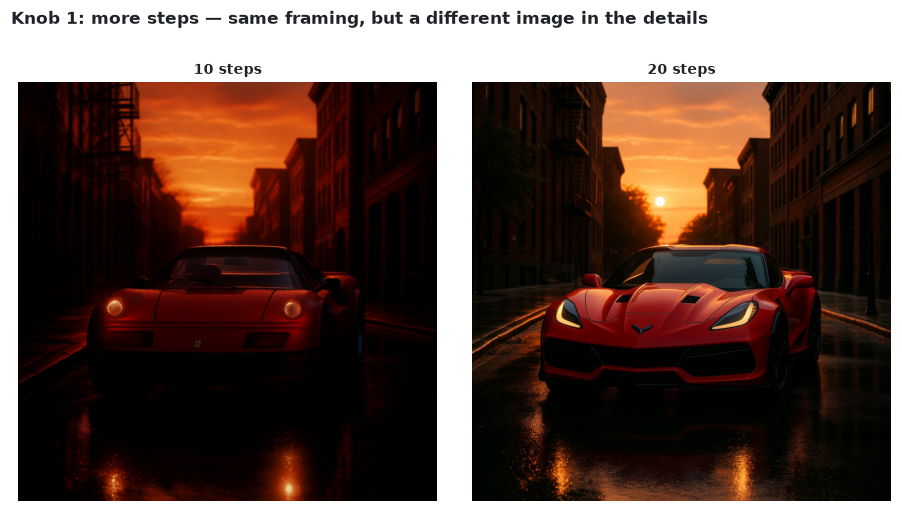

In [ ]:
t0 = time.time()
image_20 = pipe(prompt=PROMPT, negative_prompt=NEGATIVE_PROMPT,
                width=WIDTH, height=HEIGHT, num_inference_steps=20,
                true_cfg_scale=TRUE_CFG_SCALE,
                generator=torch.Generator(device=DEVICE).manual_seed(SEED)).images[0]
t20 = time.time() - t0
print(f"20 步用时 {t20:.1f}s（前向 40 次）")

fig = qv.plot_image_row([image_pipe, image_20],
                        [f"{STEPS} steps", "20 steps"],
                        "Knob 1: more steps — same framing, but a different image in the details", height=4.2)
qv.save(fig, "guide_13a_steps")
plt.show()

### 旋钮二：CFG（`true_cfg_scale`）

设成 1.0 就等于关掉 CFG：不再跑负面那次前向，**每步只前向一次，时间直接减半**。

CFG=4.0  10 步  前向 20 次
CFG=1.0  10 步  前向 10 次   用时 16.0s


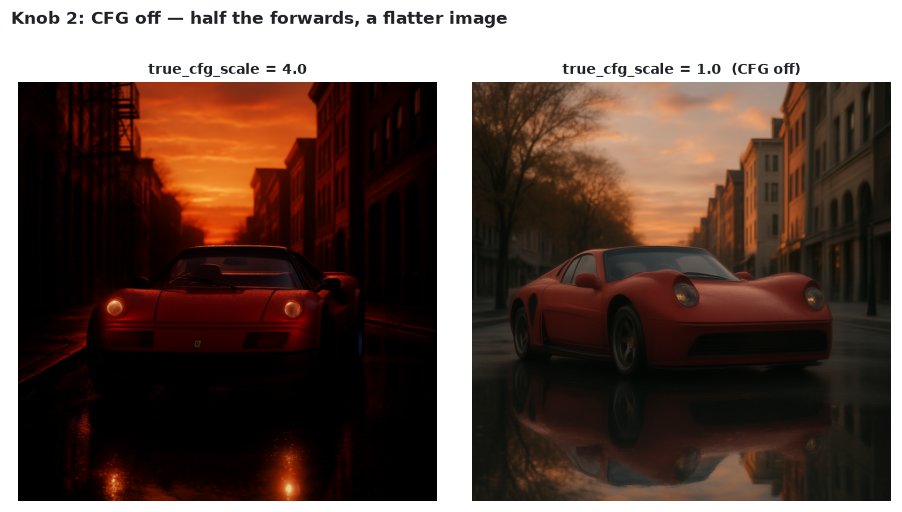

In [ ]:
t0 = time.time()
image_nocfg = pipe(prompt=PROMPT, negative_prompt=NEGATIVE_PROMPT,
                   width=WIDTH, height=HEIGHT, num_inference_steps=STEPS,
                   true_cfg_scale=1.0,
                   generator=torch.Generator(device=DEVICE).manual_seed(SEED)).images[0]
t_nocfg = time.time() - t0
print(f"CFG=4.0  {STEPS} 步  前向 {STEPS*2} 次")
print(f"CFG=1.0  {STEPS} 步  前向 {STEPS} 次   用时 {t_nocfg:.1f}s")

fig = qv.plot_image_row([image_pipe, image_nocfg],
                        ["true_cfg_scale = 4.0", "true_cfg_scale = 1.0  (CFG off)"],
                        "Knob 2: CFG off — half the forwards, a flatter image", height=4.2)
qv.save(fig, "guide_13b_cfg")
plt.show()

### 旋钮三：分辨率，和时间到底花在哪

In [ ]:
import csv
path = "../results/bf16_inference_characterization/pipeline_latency_profile.csv"
print("耗时分布：1024x1024、BF16、50 步、未开 CFG（所以前向 50 次，不是 100 次）")
print("来源：results/bf16_inference_characterization/，此前的干净实测 —— 不是本 notebook 的计时")
print()
print(f"{'阶段':<26}{'调用次数':>10}{'耗时 s':>12}{'占比':>10}")
for row in csv.DictReader(open(path)):
    print(f"{row['stage']:<26}{row['calls'] or '-':>10}{float(row['time_s']):>12.3f}"
          f"{float(row['percentage']):>9.2f}%")
print()
print(f"那次基准里单次前向  {81.429/50:.2f}s")
print(f"本次 20 步 + CFG    {t20:.1f}s / (20 x 2) = {t20/40:.2f}s 每次前向")
print("两者差在 warmup 和机器状态，量级一致：耗时 ~= 前向次数 x 单次前向时间")

耗时分布：1024x1024、BF16、50 步、未开 CFG（所以前向 50 次，不是 100 次）
来源：results/bf16_inference_characterization/，此前的干净实测 —— 不是本 notebook 的计时

阶段                              调用次数        耗时 s        占比
Prompt Encoding                    1       0.093     0.11%
Latent Preparation                 1       0.000     0.00%
Transformer Forward               50      81.429    99.06%
Scheduler Update                  50       0.003     0.00%
Latent Unpacking                   1       0.000     0.00%
VAE Decode                         1       0.649     0.79%
Image Postprocessing               1       0.017     0.02%
Other Pipeline Overhead            -       0.013     0.02%

那次基准里单次前向  1.63s
本次 20 步 + CFG    63.1s / (20 x 2) = 1.58s 每次前向
两者差在 warmup 和机器状态，量级一致：耗时 ~= 前向次数 x 单次前向时间


**结论**：

1. **步数决定细节，不会把同一张图变清楚。** 两张图的**框架**一致（车居中、街道纵深），这部分由 §10 说的"前两三步定构图"决定；但车型、曝光、光线细节明显不同 ——
   因为 σ 时间表随步数改变，两条轨迹从第一步就分叉（§9）。
   **想要更多细节就加步数，但不可能复现同一张图。**
2. **关掉 CFG 省一半时间**：前向次数从 20 次降到 10 次，耗时也差不多减半。
   代价看右图 —— 提示词里最戏剧性的部分（sunset 的强逆光、湿路面的反光）明显变弱，画面更平。
   耗时 ≈ 前向次数 × 单次前向，前向次数 = 步数 ×（开 CFG 则 2）。
3. **时间 99.06% 在 transformer 上**（文本编码 0.11%、VAE 解码 0.79%）。
   想提速只有一个地方值得动 —— 而分辨率是最贵的旋钮：边长翻倍，注意力开销 ×16（§8）。

---
## 14. 自检：上面讲的到底对不对

§10 手写了一遍去噪循环。**手写的东西凭什么算数？** 这一节做三项比对，
对不上就说明前面的解释是错的。

| # | 检查 | 验证什么 |
|---|---|---|
| I1 | `x_next == x_t + (σ_next − σ) × v` | §4 和 §10 里那条"走一步"的算式 |
| I2 | CFG 合成到底是不是只做线性放大 | §10 的第 3 行 |
| I3 | 手写循环的成品图 vs `pipe(...)` 的成品图，逐像素 | 整条链路 |

In [ ]:
def report(name, predicted, actual):
    d = (predicted.float() - actual.float()).abs()
    scale = actual.float().abs().mean()
    print(f"{name:<32} max {d.max():>9.5f}   mean {d.mean():>9.5f}   "
          f"mean/scale {d.mean() / scale:>7.2%}")

s = steps[-1]
report("I1  euler update",
       s["x_t"].float() + (s["sigma_next"] - s["sigma"]) * s["v"].float(),
       final_latents)

print()
p = steps[0]
cond, uncond = p["v_cond"].float(), p["v_uncond"].float()
combined = uncond + TRUE_CFG_SCALE * (cond - uncond)
rescaled = combined * (cond.norm(dim=-1, keepdim=True) / combined.norm(dim=-1, keepdim=True))
report("I2  linear blend only", combined, p["v"])
report("I2  blend + norm rescale", rescaled, p["v"])

I1  euler update                 max   0.00406   mean   0.00077   mean/scale   0.14%

I2  linear blend only            max   2.85938   mean   0.45503   mean/scale  52.54%
I2  blend + norm rescale         max   0.03945   mean   0.00272   mean/scale   0.31%


I1 和 I2 的第二行，误差落在 **bf16 的有效位数**（约 3 位十进制）上 —— 这是数值上的相等。
I2 的第一行差了两个数量级，是真的不成立：**Qwen-Image 的 CFG 在线性放大之后还多做了一步
"把长度调回原样"**（§10 代码里的最后一行）。这种细节，只靠读文档是发现不了的。

### I3：端到端

最严格的一项 —— 手写循环的成品图，和 §2 那张 `pipe(...)` 的图，逐像素比。

但比之前先要知道**噪声地板**：GPU 上 bf16 的规约顺序不保证逐次一致，
所以 `pipe(...)` 跑两次本身可能就不完全一样。先量出这个地板，
才知道手写循环的差异是"实现不同"还是"就是噪声"。

In [ ]:
def compare(name, img_a, img_b):
    a = np.asarray(img_a).astype(np.int16)
    b = np.asarray(img_b).astype(np.int16)
    d = np.abs(a - b)
    print(f"{name:<34} max {d.max():>3}/255   mean {d.mean():>7.4f}   "
          f"identical pixels {(d.max(-1) == 0).mean():>6.2%}")
    return d

image_pipe_again = pipe(prompt=PROMPT, negative_prompt=NEGATIVE_PROMPT,
                        width=WIDTH, height=HEIGHT, num_inference_steps=STEPS,
                        true_cfg_scale=TRUE_CFG_SCALE,
                        generator=torch.Generator(device=DEVICE).manual_seed(SEED)).images[0]

floor = compare("noise floor: pipe vs pipe", image_pipe, image_pipe_again)
diff = compare("I3: hand-written loop vs pipe", final_image, image_pipe)
print()
print("差异是否在噪声地板之内:", "是" if diff.max() <= floor.max() else "否")

noise floor: pipe vs pipe          max   0/255   mean  0.0000   identical pixels 100.00%
I3: hand-written loop vs pipe      max   0/255   mean  0.0000   identical pixels 100.00%

差异是否在噪声地板之内: 是


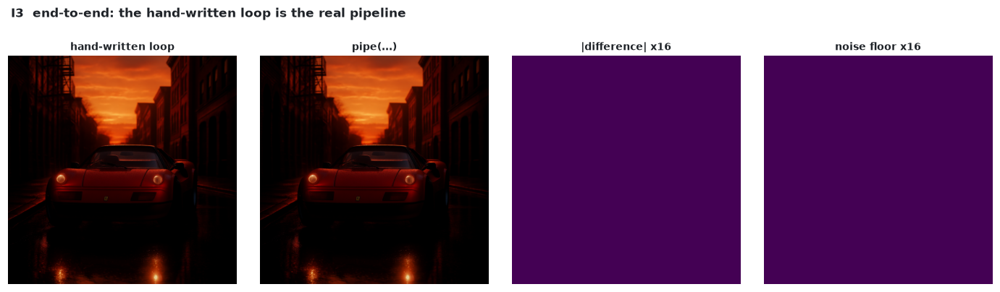

In [ ]:
fig = qv.plot_image_row(
    [final_image, image_pipe,
     np.clip(diff.max(-1) * 16, 0, 255).astype(np.uint8),
     np.clip(floor.max(-1) * 16, 0, 255).astype(np.uint8)],
    ["hand-written loop", "pipe(...)", "|difference| x16", "noise floor x16"],
    "I3  end-to-end: the hand-written loop is the real pipeline")
qv.save(fig, "guide_14_identity")
plt.show()

**结论**：三项都对上了。**噪声地板是 0**（这台机器上 bf16 推理是确定性的，`pipe(...)`
跑两次逐像素完全一致），而手写循环和 `pipe(...)` 的差异**也是 0，100% 像素相同** ——
§10 手写的循环**就是** `pipe(...)` 在做的事，所以前面每一张中间图都是真的，不是"示意图"。

地板是 0 这一点很重要：它意味着**任何非零差异都必须能被解释，不能推给"浮点噪声"**。

> 这套自检不是走过场。同样的检查在本仓库进阶版 notebook 里第一次跑的时候，
> 抓到过 **max 14/255、只有 81% 像素相同** 的差异；逐前向比对后定位到解码时
> `1.0/std` 的取倒数与精度转换的顺序 —— 常数差 4e-3，经 VAE 放大成肉眼可见的偏色。
> 它不违反 I1、I2 任何一条，**只做 I1/I2 是抓不到的**。

想看更严格的版本：`qwen_trace/`（每一步按内容哈希存档 + 独立重算）、
`prompt_to_image/`（用 numpy 把每一步重算一遍逐元素比对）。

---
## 附录 A：一路上数据长什么样

In [ ]:
rows = [
    ("0  你的句子",        "字符串",       f"{len(PROMPT)} 个字符"),
    ("6  套模板+切词",     "token id",     str((1, len(tokens)))),
    ("6  丢掉模板前缀",    "保留的 token", str((1, len(kept_tokens)))),
    ("6  文本编码",        "词向量",       str(tuple(prompt_embeds.shape))),
    ("7  随机噪声",        "latent 网格",  str(tuple(noise_grid.shape))),
    ("8  打包",            "token 序列",   str(tuple(initial_latents.shape))),
    ("10 去噪循环 x " + str(STEPS), "token 序列", str(tuple(final_latents.shape))),
    ("12 解包",            "latent 网格",  str(tuple(unpacked.shape))),
    ("12 VAE 解码",        "像素",         str(tuple(pixels.shape))),
    ("12 后处理",          "图片",         str((final_image.height, final_image.width))),
]
print(f"{'在哪一步':<22}{'是什么':<14}{'形状'}")
print("-" * 68)
for a, b, c in rows:
    print(f"{a:<22}{b:<14}{c}")

在哪一步                  是什么           形状
--------------------------------------------------------------------
0  你的句子               字符串           114 个字符
6  套模板+切词             token id      (1, 61)
6  丢掉模板前缀             保留的 token     (1, 27)
6  文本编码               词向量           (1, 27, 3584)
7  随机噪声               latent 网格     (1, 16, 1, 128, 128)
8  打包                 token 序列      (1, 4096, 64)
10 去噪循环 x 10          token 序列      (1, 4096, 64)
12 解包                 latent 网格     (1, 16, 1, 128, 128)
12 VAE 解码             像素            (1, 3, 1, 1024, 1024)
12 后处理                图片            (1024, 1024)


---
## 附录 B：八个常见疑问

| 问题 | 答案 |
|---|---|
| 为什么同一个 prompt 每次出图不一样？ | 变的是 seed（§7）。固定 seed 就复现 |
| 负面提示词怎么起作用的？ | 它跑了独立的一次前向，CFG 把"正面 − 负面"的差放大 4 倍（§10、§11）|
| 加步数能改构图吗？ | 基本不能。构图在最前面一两步就定了，步数只买细节（§10、§13）|
| 步数从 10 改成 20，是"走得更细"吗？ | 不是。σ 时间表本身就变了，是换了条路（§9）|
| 为什么 2048×2048 慢那么多？ | token 数 ×4，注意力计算量 ×16（§8）|
| 分辨率是谁决定的？ | latent 网格大小。VAE 固定放大 8 倍，打包再 2 倍，所以边长必须是 16 的倍数 |
| 模型见过像素吗？ | 没有。全程在 128×128×16 的 latent 里算，只有最后一步才翻译回像素（§5）|
| 想提速先动哪里？ | 只有 transformer 值得动，它占 99.06%（§13）|

---